In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q torchinfo


In [ ]:
!pip install -q transformers
!pip install -q SentencePiece


In [ ]:
import os
import json
import copy

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import WeightedRandomSampler

from torchvision import transforms
from torchinfo import summary as model_summary


In [ ]:
from transformers import AutoModel, AutoTokenizer


In [ ]:
seed_value = 42

np.random.seed(seed_value)
torch.manual_seed(seed_value)

if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
!unzip -u -q /content/drive/MyDrive/DSC/Dataset/Training/training-images.zip -d /content/sample_data/TrainingImages

In [ ]:
train_dir               = '/content/sample_data/TrainingImages/train-images'
train_annotation_file   = '/content/drive/MyDrive/DSC/Dataset/Training/vimmsd-train.json'
gen_caption_file        = '/content/drive/MyDrive/DSC/Dataset/Training/generated_caption.json'

In [ ]:
with open(gen_caption_file, 'r') as f:
    gen_captions = json.load(f)

gen_caption_df = pd.DataFrame(gen_captions)
gen_caption_df.rename(columns={'image_name': 'image'}, inplace=True)
gen_caption_df.head()

,id,image,generated_caption
0,0,8ae451edcd8ebf697f8763ece249115813149c55733bf8...,Hình ảnh cho thấy một cô gái trẻ đang cười rạn...
1,1,35370ffd6c791d6f8c4ab3dd4363ed468fab41e4824ee9...,Bức ảnh là một bài đăng trên mạng xã hội với t...
2,2,316fdd1477725b9fb1a55015ac06b68b92b50bd4303e08...,Bức ảnh chụp một người phụ nữ đang đứng trước ...
3,3,8a0f34e0e30e4e5cfb306933c1d25fa801a5da78646b59...,Bức ảnh chụp một người đàn ông đang ngồi trên ...
4,4,e517a5e95d1065886a7c815e82fe254381d4f9f4b244d4...,Bức ảnh chụp hai người phụ nữ đang ngồi trên g...


In [ ]:
with open(train_annotation_file, 'r') as f:
    annotations = json.load(f)

annotation_df = pd.DataFrame.from_dict(annotations, orient='index')
annotation_df.head()

,image,caption,label
0,8ae451edcd8ebf697f8763ece249115813149c55733bf8...,Cô ấy trên mạng vs cô ấy ngoài đời =))),multi-sarcasm
1,35370ffd6c791d6f8c4ab3dd4363ed468fab41e4824ee9...,Người tâm linh giao tiếp với người thực tế :))),not-sarcasm
2,316fdd1477725b9fb1a55015ac06b68b92b50bd4303e08...,Hình như Trăng hôm nay đẹp quá mọi người ạ! 😃 ...,multi-sarcasm
3,8a0f34e0e30e4e5cfb306933c1d25fa801a5da78646b59...,MỌI NGƯỜI NGHĨ SAO VỀ PHÁT BIỂU CỦA SHARK VIỆT...,not-sarcasm
4,e517a5e95d1065886a7c815e82fe254381d4f9f4b244d4...,2 tay hai nàng chứ việc gì phải lệ hai hàng,multi-sarcasm


In [ ]:
merged_df = pd.merge(gen_caption_df, annotation_df, on='image')
merged_df.head()

,id,image,generated_caption,caption,label
0,0,8ae451edcd8ebf697f8763ece249115813149c55733bf8...,Hình ảnh cho thấy một cô gái trẻ đang cười rạn...,Cô ấy trên mạng vs cô ấy ngoài đời =))),multi-sarcasm
1,1,35370ffd6c791d6f8c4ab3dd4363ed468fab41e4824ee9...,Bức ảnh là một bài đăng trên mạng xã hội với t...,Người tâm linh giao tiếp với người thực tế :))),not-sarcasm
2,2,316fdd1477725b9fb1a55015ac06b68b92b50bd4303e08...,Bức ảnh chụp một người phụ nữ đang đứng trước ...,Hình như Trăng hôm nay đẹp quá mọi người ạ! 😃 ...,multi-sarcasm
3,3,8a0f34e0e30e4e5cfb306933c1d25fa801a5da78646b59...,Bức ảnh chụp một người đàn ông đang ngồi trên ...,MỌI NGƯỜI NGHĨ SAO VỀ PHÁT BIỂU CỦA SHARK VIỆT...,not-sarcasm
4,4,e517a5e95d1065886a7c815e82fe254381d4f9f4b244d4...,Bức ảnh chụp hai người phụ nữ đang ngồi trên g...,2 tay hai nàng chứ việc gì phải lệ hai hàng,multi-sarcasm


In [ ]:
mapping = {
    'not-sarcasm': 0,
    'multi-sarcasm': 1,
    'image-sarcasm': 2,
    'text-sarcasm': 3
}

merged_df['label_numeric'] = merged_df['label'].map(mapping)
merged_df.head()

,id,image,generated_caption,caption,label,label_numeric
0,0,8ae451edcd8ebf697f8763ece249115813149c55733bf8...,Hình ảnh cho thấy một cô gái trẻ đang cười rạn...,Cô ấy trên mạng vs cô ấy ngoài đời =))),multi-sarcasm,1
1,1,35370ffd6c791d6f8c4ab3dd4363ed468fab41e4824ee9...,Bức ảnh là một bài đăng trên mạng xã hội với t...,Người tâm linh giao tiếp với người thực tế :))),not-sarcasm,0
2,2,316fdd1477725b9fb1a55015ac06b68b92b50bd4303e08...,Bức ảnh chụp một người phụ nữ đang đứng trước ...,Hình như Trăng hôm nay đẹp quá mọi người ạ! 😃 ...,multi-sarcasm,1
3,3,8a0f34e0e30e4e5cfb306933c1d25fa801a5da78646b59...,Bức ảnh chụp một người đàn ông đang ngồi trên ...,MỌI NGƯỜI NGHĨ SAO VỀ PHÁT BIỂU CỦA SHARK VIỆT...,not-sarcasm,0
4,4,e517a5e95d1065886a7c815e82fe254381d4f9f4b244d4...,Bức ảnh chụp hai người phụ nữ đang ngồi trên g...,2 tay hai nàng chứ việc gì phải lệ hai hàng,multi-sarcasm,1


In [ ]:
train_df, val_df = train_test_split(merged_df, test_size=0.2, random_state=42)
len(train_df), len(val_df)

(8644, 2161)

In [ ]:
class_counts = train_df['label_numeric'].value_counts().sort_index().values
class_counts    # theo thứ tự 0, 1, 2, 3

array([4852, 3378,  358,   56])

In [ ]:
sample_weights = 1. / class_counts
sample_weights

array([0.0002061 , 0.00029603, 0.0027933 , 0.01785714])

In [ ]:
train_df['weight'] = train_df['label_numeric'].map(lambda label: sample_weights[label])
train_df.head()

,id,image,generated_caption,caption,label,label_numeric,weight
4030,4030,4a2132cc4f26779047b5d0b21afeb70a6eb7ff585eeed4...,"Bức ảnh có nền đen, ở giữa là dòng chữ ""Dynami...",No more tai thỏ ư ư 💦💦💦,multi-sarcasm,1,0.000296
1599,1599,28567e0fc32ae4815bd077847d9bc5efccbf2dc2f8fc9f...,"Bức ảnh có bố cục đơn giản, tập trung vào hình...","Ngày 16/5, cơ quan chức năng Malawi cho biết m...",not-sarcasm,0,0.000206
7258,7258,94b125be1264ef8da36c05ea06994e3c4ea80851608fe1...,Bức ảnh là một meme với hình ảnh một người đàn...,- Ryan Gosling\n#interpool,not-sarcasm,0,0.000206
5372,5372,a665fc86a56dd77f92956a479b573a5e91ae05e884de43...,"Bức ảnh được chia thành 4 phần, mỗi phần là mộ...",Mùa giải thăng hoa tột đỉnh của đương kim Quả ...,multi-sarcasm,1,0.000296
8259,8259,bf20baa60faec85118979a55794b57dcf626d57854073b...,"Bức ảnh có bố cục đơn giản, tập trung vào hình...","Kelly Knipes (42 tuổi, người Anh) cho biết cô ...",not-sarcasm,0,0.000206


In [ ]:
sampler = WeightedRandomSampler(
    weights=train_df['weight'].values,
    num_samples=len(train_df['weight']),
    replacement=True
)

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, dataframe, data_dir, transform=None):
        self.dataframe = dataframe
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):

        image_file = self.dataframe.iloc[idx]['image']
        image_path = os.path.join(self.data_dir, image_file)
        image = Image.open(image_path).convert('RGB')

        generated_caption   = self.dataframe.iloc[idx]['generated_caption']
        caption             = self.dataframe.iloc[idx]['caption']
        label               = self.dataframe.iloc[idx]['label_numeric']

        if self.transform:
            image = self.transform(image)

        return {
            'image':                image,
            'generated_caption':    generated_caption,
            'caption':              caption,
            'label':                label,
        }

In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.PILToTensor(),
])

train_dataset = CustomDataset(dataframe=train_df, data_dir=train_dir, transform=transform)
val_dataset = CustomDataset(dataframe=val_df, data_dir=train_dir, transform=transform)

len(train_dataset), len(val_dataset)

(8644, 2161)

In [ ]:
batch_size = 64

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


 0


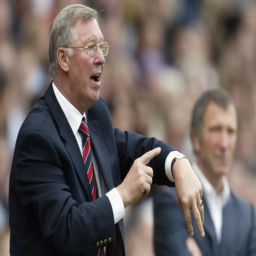

Generated: 
	 Bức ảnh chụp cận cảnh một người đàn ông mặc vest đen, áo sơ mi trắng và cà vạt đỏ. Anh ta đang chỉ tay về phía trước, có vẻ như đang nói chuyện với khán giả. Phía sau anh ta là một người đàn ông khác cũng mặc vest đen, áo sơ mi trắng và cà vạt đỏ.  Bối cảnh của bức ảnh là một sân vận động với rất nhiều khán giả. Không có bất kỳ văn bản nào được nhận dạng trong ảnh.
Original: 
	 FERGIEEEEE TIMEEEEEEEEEEEEE !!!!!!
Với những người thường xuyên theo dõi bóng đá thì chắc hẳn chúng ta không còn lạ gì khái niệm Fergie Time.
Để hiểu nôm na thì đây là khoảng thời gian rùa nhất của MU và cái sự rùa này mỉa mai thay lại khiến rất nhiều đội bóng khác chết lặng, rất nhiều anti fan câm nín và có thể nói, xem ngoại hạng Anh xong được chứng kiến Fergie Time thì nó không khác gì ăn đặc sản xong được đi chấm kèm với đúng thứ gia vị tinh túy nhất.
Chúc mừng MU, lâu lắm rồi mới được sống lại cảm giác này. Phê!

Label: 3

 1


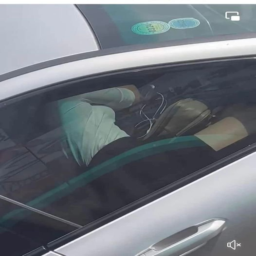

Generated: 
	 Bức ảnh chụp cận cảnh phần cửa sổ của một chiếc xe hơi màu bạc.  Có thể thấy một người đàn ông đang ngồi trong xe, mặc áo trắng và quần đen. Anh ta đang đeo khẩu trang y tế và có vẻ như đang nghe điện thoại. Bức ảnh được chụp từ góc nghiêng, cho phép nhìn thấy toàn bộ phần cửa sổ của chiếc xe.
Original: 
	 Cảm động cô gái quá mệt mỏi, nằm tựa người lên lưng bạn trai. 
Đấy đâu phải đi xe hơi là sướng đâu. 🥹

Label: 1

 2


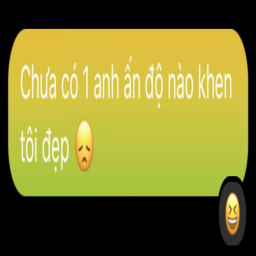

Generated: 
	 Bức ảnh hiển thị một nút bấm màu vàng nhạt với dòng chữ "Chưa có 1 anh ấn độ nào khen tôi đẹp" được viết bằng font chữ trắng, cỡ chữ lớn. Bên dưới dòng chữ là biểu tượng cảm xúc mặt cười màu đen.
Original: 
	 <username>

Label: 2

 3


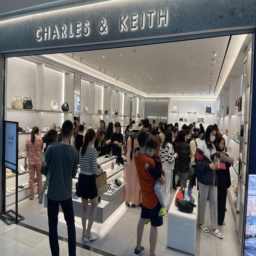

Generated: 
	 Bức ảnh chụp một cửa hàng thời trang có tên là "CHARLES & KEITH". Cửa hàng được thiết kế hiện đại với tông màu trắng chủ đạo. Bên trong cửa hàng, có nhiều kệ trưng bày các sản phẩm thời trang như giày dép, túi xách, và phụ kiện. Có rất nhiều người đang mua sắm tại cửa hàng. Ở phía trước cửa hàng, một nhóm người đang đứng chờ đợi để mua sắm. Trên tường của cửa hàng có dòng chữ "CHARLES & KEITH" được viết bằng chữ vàng nổi bật.
Original: 
	 10h đêm nhưng các chị em vẫn vui như trẩy hội ở Vincom Center Bà Triệu, Vincom Center Landmark 81 &amp; Vincom Center Đồng Khởi 💃
Khả năng cao quỹ đen của anh em và thứ 6 đen trùng tên là có lí do 😇
À cho bác nào chưa biết, Vincom Center Bà Triệu, Vincom Center Đồng Khởi &amp; Vincom Center Landmark 81  sẽ mở cửa đến tận 23h đêm duy nhất trong ngày Black Friday 24.11, nên các chị em cứ thoải mái càn quét đi nhé, ae chúng tôi chờ dc 🥶
#Vincom #VincomBlackFriday2023 #Toyderland

Label: 3

 4


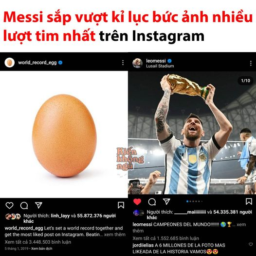

Generated: 
	 Bức ảnh là một bài đăng trên Instagram với tiêu đề "Messi sắp vượt kỉ lục bức ảnh nhiều lượt tìm nhất trên Instagram".  Bức ảnh được chia thành hai phần chính. Phần bên trái là hình ảnh một quả bóng đá, bên cạnh là dòng chữ "World Record Egg" và thông tin người thích: "linjay and 85.872.736 người world record together and get the most liked post on Instagram. Xem tất cả 4.9450 bình luận". Phần bên phải là hình ảnh một cầu thủ bóng đá đang vươn tay lên cao, bên cạnh là dòng chữ "Leomessi Lusaila Stadium" và thông tin người thích: "campeonados del mundio!!! xem todas las 4.156 millones de fotos jordians a millondes de la foto mas likes".
Original: 
	 QUẢ TRỨNG CÓ TRƯỚC HAY MESSI CÓ TRƯỚC? 🥚
Quả trứng gà này đang giữ kỉ lục Guinness là bức ảnh được yêu thích nhất trên Instagram với hơn 55,7 triệu lượt thích 🥚
Nhưng Lionel Messi, cầu thủ bóng đá vừa chiến thắng World Cup 2022 đang lăm le cái kỉ lục này =))) Anh đã đuổi sát sau lưng quả trứng kia với 54 triệu ở thời điểm hiện 

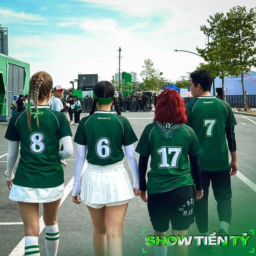

Generated: 
	 Bức ảnh chụp một nhóm 4 người đang đi bộ trên đường. Họ đều mặc áo thun màu xanh lá cây với dòng chữ "Show Tiền Ty" được in trên ngực áo. Người ở giữa có số 6, người bên trái có số 8, người bên phải có số 7 và người bên dưới có số 17. Bức ảnh được chụp từ góc nhìn ngang, cho thấy toàn bộ thân hình của các thành viên trong nhóm.
Original: 
	 Nhìn đi mấy má, dàn cast show tiền tỷ nhìn là đoán được luôn rồi nè
Má nào hổm đoán sai ra đây chịu phạt đi 😎
 #KENLEAGUE #ShowTienTy

Label: 3

 6


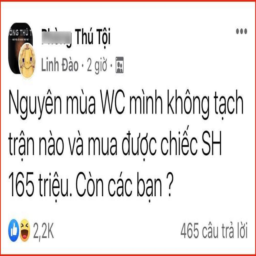

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội, có bố cục đơn giản với nền trắng và các dòng chữ màu đen. Ở góc trên bên trái là hình ảnh của người dùng Thú Tội với dòng chữ "Thú Tội" ở phía dưới. Bên phải là thông tin về người dùng: "Linh Đào - 2 giờ". Phía dưới là nội dung bài đăng: "Nguyên mùa WC mình không tách trận nào và mua được chiếc SH 165 triệu. Còn các bạn ?". Dưới cùng là số lượng点赞 (2,2K) và số câu trả lời (465 câu).
Original: 
	 Ngài

Label: 1

 7


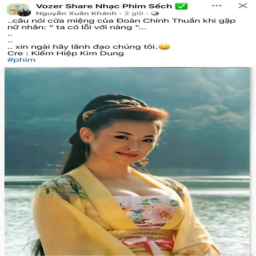

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội với tiêu đề "Vozer Share Nhạc Phim Sêch".  Bài đăng có nội dung: "...câu nói của miệng của Đoàn Chính Thuần khi gặp nữ nhân: "ta có lỗi với nàng..."... xin ngài hãy lãnh đạo chúng tôi. Cre: Kiểm Hiệp Kim Dung #phim".  Bên dưới bài đăng là hình ảnh một người phụ nữ mặc trang phục truyền thống Việt Nam, có vẻ như đang đứng trước một hồ nước.
Original: 
	 Phim cần được sản xuất: Thời niên thiếu của Đoàn Chính Thuần.

Label: 0

 8


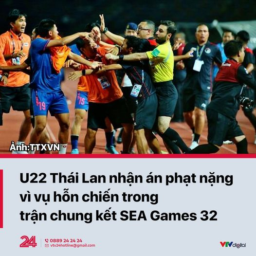

Generated: 
	 Bức ảnh có bố cục đơn giản, tập trung vào hình ảnh một nhóm người đang nắm tay nhau. Phía trên là dòng chữ "Ảnh: TTXVN", phía dưới là dòng chữ "U22 Thái Lan nhận án phạt nặng vì vụ hỗn chiến trong trận chung kết SEA Games 32" và thông tin liên lạc của VTV Digital.
Original: 
	 Hiệp hội bóng đá Thái Lan đã thay mặt Hoàng gia Thái Lan đưa ra hình phạt chính thức dành cho đội U22 Thái Lan sau vụ ẩu đả không đáng có ở chung kết SEA Games 32.  
Cụ thể, 3 người trong ban huấn luyện U22 Thái Lan sẽ bị cấm làm nhiệm vụ ở các cấp độ đội tuyển trong vòng 1 năm. 3 người này là ông Prasadchok Chokmoh (HLV thủ môn), ông Mayed Madad và ông Patrawut Wongsripuek (Lãnh đạo đội).
Theo thông cáo từ Liên đoàn bóng đá Thái Lan, những thành viên này đều bị phạt nặng do có kiến thức, kinh nghiệm và tuổi tác trưởng thành hơn so với lứa các cầu thủ U22. Thế nhưng, đây lại là 3 cá nhân đã không giữ được bình tĩnh và khởi nguồn cho màn hỗn chiến với U22 Indonesia.
Bên cạnh đó, 2 cầu thủ của đội U22

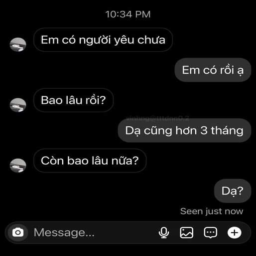

Generated: 
	 Bức ảnh hiển thị giao diện của một cuộc điện thoại trên điện thoại di động. Giao diện được thiết kế đơn giản với nền đen và các nút bấm màu trắng.  Phần đầu trang hiển thị thông tin về thời gian (10:34 PM) và tiêu đề "Em có người yêu chưa". Tiếp theo là hai câu hỏi: "Bao lâu rồi?" và "Dạ cũng hơn 3 tháng". Cuối cùng là câu hỏi cuối cùng: "Còn bao lâu nữa?" và dòng chữ "Da?".
Original: 
	 Kẻ thức thời là trang tuấn kiệt =))

Label: 1

 10


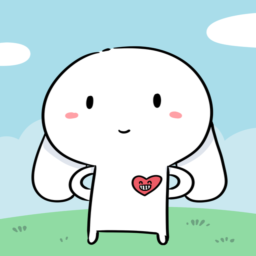

Generated: 
	 Bức ảnh là một hình minh họa đơn giản với một nhân vật hoạt hình màu trắng được vẽ theo phong cách hoạt hình vui nhộn. Nhân vật này đang đứng trên một ngọn đồi xanh mướt, phía sau là bầu trời xanh nhạt và những đám mây trắng. Nhân vật có đôi mắt to tròn, nụ cười rạng rỡ và hai cánh tay dang rộng. Trên ngực của nhân vật là một trái tim màu đỏ với khuôn mặt cười rạng rỡ. Bức ảnh mang đến cảm giác vui tươi, dễ thương và thân thiện.
Original: 
	 Tôi thường tỏ ra mình là người vui vẻ trên facebook. Nhưng không ai biết tận sâu trong lòng, tôi vui vẻ hơn.

Label: 3

 11


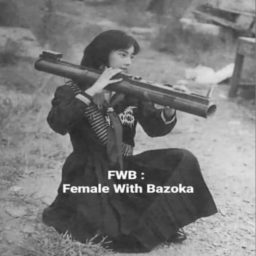

Generated: 
	 Bức ảnh đen trắng này chụp một người phụ nữ trẻ đang cầm một khẩu súng ngắn. Cô ấy mặc trang phục truyền thống của Việt Nam và đang đứng trên nền đất. Bức ảnh được chụp từ góc nghiêng, cho phép người xem nhìn thấy toàn bộ khuôn mặt của người phụ nữ. Người phụ nữ đang nhìn về phía máy ảnh với vẻ mặt nghiêm nghị. Phía dưới bức ảnh có dòng chữ "FWB: Female With Bazoka".
Original: 
	 -kem-
#interpool

Label: 2

 12


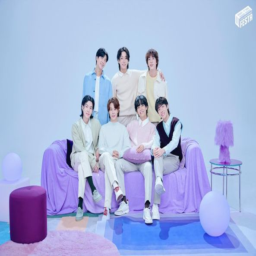

Generated: 
	 Bức ảnh chụp một nhóm 5 người trẻ tuổi đang ngồi trên một chiếc ghế màu tím, xung quanh họ là những vật dụng trang trí đơn giản. Phía sau họ là một bức tường màu xanh nhạt với dòng chữ "FESTA" được in nổi bật ở góc trên bên phải. Bức ảnh có bố cục đơn giản, tập trung vào các nhân vật chính và tạo cảm giác vui tươi, rộn ràng.
Original: 
	 BTS kỷ niệm 10 năm ra mắt 🥳 Happy 10th Anniversary

Label: 1

 13


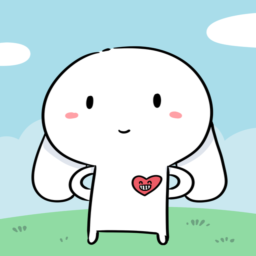

Generated: 
	 Bức ảnh là một hình minh họa đơn giản với một nhân vật hoạt hình màu trắng được vẽ theo phong cách hoạt hình vui nhộn. Nhân vật này đang đứng trên một ngọn đồi xanh mướt, phía sau là bầu trời xanh nhạt và những đám mây trắng. Nhân vật có đôi mắt to tròn, nụ cười rạng rỡ và hai cánh tay dang rộng. Trên ngực của nhân vật là một trái tim màu đỏ với khuôn mặt cười rạng rỡ. Bức ảnh mang đến cảm giác vui tươi, dễ thương và thân thiện.
Original: 
	 Tôi thường tỏ ra mình là người vui vẻ trên facebook. Nhưng không ai biết tận sâu trong lòng, tôi vui vẻ hơn.

Label: 3

 14


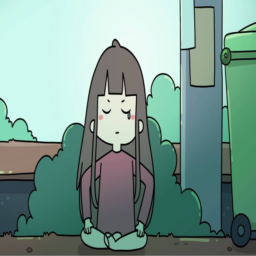

Generated: 
	 Bức ảnh là một hình minh họa đơn giản với một cô gái tóc nâu đang ngồi trên mặt đất. Cô gái mặc áo màu hồng và quần màu xanh lá cây. Cô gái đang cúi xuống, mắt nhắm nghiêng và có vẻ buồn bã. Bên cạnh cô gái là một chiếc thùng rác màu xanh lá cây và một đám mây màu xanh lá cây. Bức ảnh được vẽ theo phong cách hoạt hình vui nhộn.
Original: 
	 Chân thành xin lỗi các bạn đang đợi clip. Quá trình tải lên của bên tui hiện đang bị trục trặc mà ko tìm được lý do. Clip lần này tận 5 phút rưỡi và không có nhãn hàng. Tụi tui cũng rất là muốn lên sớm. Sự cố này thật là vl 🙁 Chúng tui cũng đang rất buồn, nhưng sẽ cố gắng lên clip vào trưa mai. Sorry các bạn lần nữa nhiều lắm ._.

Label: 3

 15


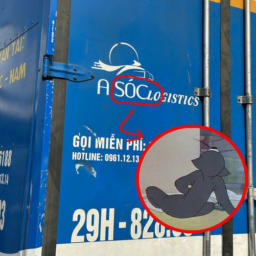

Generated: 
	 Bức ảnh chụp một tấm biển quảng cáo màu xanh dương với dòng chữ "A SÓC LOGISTICS" được in nổi bật ở góc trên bên phải. Phía dưới là dòng chữ "GỌI MIỄN PHÍ HOTLINE: 0961.12.13" và dòng chữ "29H - 820". Bên cạnh dòng chữ này là hình ảnh một chú chó đang ngồi, có thể là một nhân viên của công ty A Sóc Logistics.
Original: 
	 - Ryan Gosling
#interpool

Label: 2

 16


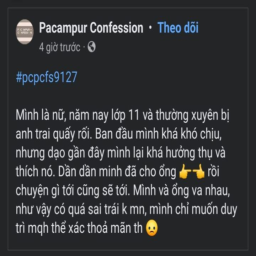

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội với tiêu đề "Tacampur Confession - Theo dõi".  Phần đầu của bài đăng hiển thị thông tin về thời gian đăng (4 giờ trước) và hashtag "#pccpfcs9127".  Nội dung chính của bài đăng là một đoạn văn bản miêu tả về một cô gái nữ đang bị anh trai quấy rối, nhưng cô ấy đã tìm thấy sự thích thú và hạnh phúc trong mối quan hệ với anh trai.  Bên cạnh đó, bức ảnh còn có các biểu tượng cảm xúc như ngón tay cái và ngón tay cái để thể hiện sự hài hước hoặc buồn bã.
Original: 
	 Nhà ngọt
-kem

Label: 3

 17


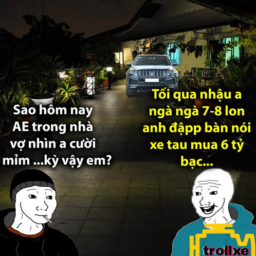

Generated: 
	 Bức ảnh có bố cục đơn giản với hai nhân vật được vẽ theo phong cách hoạt hình. Nhân vật bên trái là một người đàn ông mặc áo đen, đeo mũ đen và đang nhìn về phía trước. Nhân vật bên phải là một người đàn ông mặc áo xanh dương, đang cười rạng rỡ. Phía trên đầu mỗi nhân vật là một bong bóng thoại màu vàng với nội dung: 

- Nhân vật bên trái: "Sao hôm nay AE trong nhà vợ nhìn a cười mỉm...kỳ vậy em?" 
- Nhân vật bên phải: "Tối qua nhậu a ngà ngà 7-8 lon anh đập bàn nói xe ta mua 6 tỷ bạc..."
Original: 
	 “Về quê có tý men, tém tém cái mồm lại anh! Bọn thèng Tèo thèng Tý nhìn vậy thôi, chứ đi Lắc Xụt, C 2 xị đồ không đó anh!” – Thèng áo xanh chia sẻ

Label: 3

 18


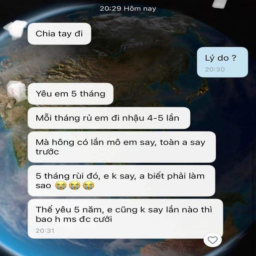

Generated: 
	 Bức ảnh là một đoạn hội thoại trên điện thoại di động. Bố cục được chia thành hai phần chính: phần trên là hình ảnh trái đất với dòng chữ "20:29 Hôm nay" ở góc trên cùng bên phải, và phần dưới là nội dung cuộc hội thoại được trình bày trong các khung thoại màu trắng. Các khung thoại có chứa các câu thoại như sau:

- "Chia tay đi"
- "Yêu em 5 tháng"
- "Mỗi tháng rủ em đi nhậu 4-5 lần"
- "Mà hồng có lần mô em say, toàn a say trước"
- "5 tháng rùi đó, e k say, a biết phải làm sao 😂😂😂"
- "Thế yêu 5 năm, e cũng k say lần nào thì bao h ms dc cưới"

Ngoài ra, bức ảnh còn có một biểu tượng trái tim nhỏ ở góc dưới bên phải.
Original: 
	 :))

Label: 2

 19


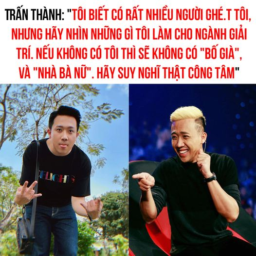

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau. Phần bên trái là hình ảnh một người đàn ông trẻ tuổi, mặc áo đen, quần xanh, đang cười và nhìn về phía máy ảnh.  Phần bên phải là hình ảnh một người đàn ông lớn tuổi hơn, tóc vàng, mặc áo đen, quần xanh, đang cười và nhìn về phía máy ảnh. Trên bức ảnh có dòng chữ "TRẦN THÀNH: "TÔI BIẾT CÓ RẤT NHIỀU NGƯỜI GHÊ TỐI, NHẬY HÌNH SỬA CHO NGÀNH GIẢI TRÍ, NÉU KHÔNG CÓ TÔI TỪ CHÚC MỪNG VÀ "NHÀ BÀ NỮ". HAY SUY NGHỊ THẬT CÔNG TÂM""
Original: 
	 Không có anh, giới giải trí sẽ mất đi một người suốt ngày hay khóc

Label: 3

 20


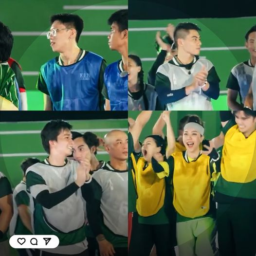

Generated: 
	 Bức ảnh được chia thành 4 phần, mỗi phần là một bức ảnh nhỏ. Phần trên cùng bên trái là hình ảnh một nhóm người đang vui mừng, trong đó có một người đàn ông mặc áo thun màu xanh dương và một người đàn ông mặc áo thun màu xanh lá cây. Phần trên cùng bên phải là hình ảnh một nhóm người đang vui mừng, trong đó có một người đàn ông mặc áo thun màu trắng và một người đàn ông mặc áo thun màu đen. Phần dưới cùng bên trái là hình ảnh một nhóm người đang vui mừng, trong đó có một người đàn ông mặc áo thun màu xanh lá cây và một người đàn ông mặc áo thun màu vàng. Phần dưới cùng bên phải là hình ảnh một nhóm người đang vui mừng, trong đó có một người phụ nữ mặc áo thun màu vàng và một người phụ nữ mặc áo thun màu xanh lá cây.
Original: 
	 Tui coi Ken League vì nội dung.
Nội dung Ken League: 😍
Có đẹp trai xinh gái quá hong dậy =))) Có ai còn thấy được “nội dung” nào nữa khonggggg
🤟Lên liền Youtube Yeah1 Show để tìm lại thử nhaaa
#KENLEAGUE #Showtienty #NangHeinekenViFanDichThuc

Lab

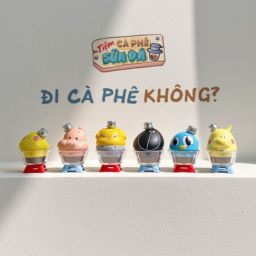

Generated: 
	 Bức ảnh chụp cận cảnh 6 chiếc cốc cà phê nhỏ, được xếp thành hàng ngang trên nền trắng. Mỗi chiếc cốc cà phê có hình dáng giống một con gà trống, với phần thân màu vàng nhạt, phần miệng màu hồng nhạt và phần đầu màu xanh dương nhạt. Trên mỗi chiếc cốc cà phê đều có dòng chữ "Tiệm cà phê sữa đá" được viết bằng font chữ in hoa màu đen, nổi bật trên nền trắng. Dưới cùng của bức ảnh là dòng chữ "ĐI CÀ PHÊ KHÔNG?" được viết bằng font chữ in hoa màu xanh lá cây, tạo cảm giác vui nhộn và thu hút sự chú ý của người xem.
Original: 
	 nếu không may mắn bạn sẽ mua trúng Én

Label: 3

 22


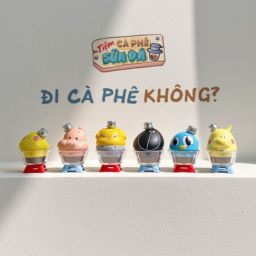

Generated: 
	 Bức ảnh chụp cận cảnh 6 chiếc cốc cà phê nhỏ, được xếp thành hàng ngang trên nền trắng. Mỗi chiếc cốc cà phê có hình dáng giống một con gà trống, với phần thân màu vàng nhạt, phần miệng màu hồng nhạt và phần đầu màu xanh dương nhạt. Trên mỗi chiếc cốc cà phê đều có dòng chữ "Tiệm cà phê sữa đá" được viết bằng font chữ in hoa màu đen, nổi bật trên nền trắng. Dưới cùng của bức ảnh là dòng chữ "ĐI CÀ PHÊ KHÔNG?" được viết bằng font chữ in hoa màu xanh lá cây, tạo cảm giác vui nhộn và thu hút sự chú ý của người xem.
Original: 
	 nếu không may mắn bạn sẽ mua trúng Én

Label: 3

 23


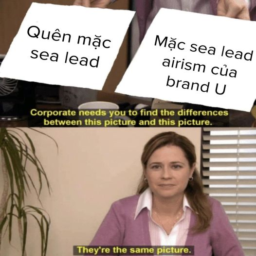

Generated: 
	 Bức ảnh có bố cục đơn giản với hai phần chính. Phần trên là hai tấm bảng trắng, một bên ghi "Quên mặc sea lead" và bên kia ghi "Mặc sea lead airism của brand U". Phần dưới là hình ảnh một người phụ nữ đang nói chuyện với nội dung: "Corporate needs you to find the differences between this picture and this picture."
Original: 
	 Post này uniqlo ko book

Label: 1

 24


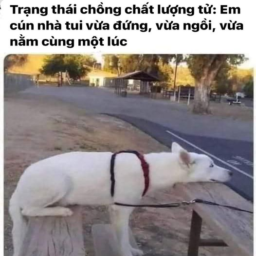

Generated: 
	 Bức ảnh có bố cục đơn giản, tập trung vào hình ảnh một con chó trắng đang ngồi trên đường. Con chó được chụp từ góc nghiêng, nhìn thẳng vào ống kính. Bối cảnh là một con đường với những hàng cây xanh mướt ở phía xa. Phía trên cùng của bức ảnh là dòng chữ "Trạng thái chồng chất lượng tử: Em cún nhà tui vừa đứng, vừa ngồi, vừa nằm cùng một lúc".
Original: 
	 Khoa học là cuộc sống =)))))
Chồng chập lượng tử (hay chồng chất lượng tử, xếp lớp lượng tử) là việc áp dụng nguyên lý chồng chập vào cơ học lượng tử. Nguyên lý chồng chập vốn là sự cộng véctơ các véctơ sóng trong giao thoa. Trong cơ học lượng tử, các véctơ hàm sóng, hay véctơ trạng thái được cộng. Điều này xảy ra khi một hệ lượng tử có cùng lúc nhiều giá trị có thể đo được cho một tính chất vật lý (như năng lượng).
Thuyết lượng tử nguyên sinh là một thuyết của nguyên tử và phân tử. Trong mô hình phát triển ban đầu của Bohr và Heisenberg, nó đòi hỏi thế giới phân chia thành 2 thành phần. Một phần là hệ thống được nghiên

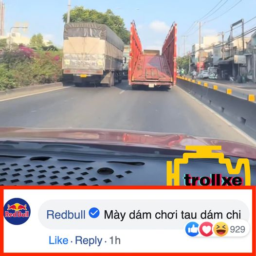

Generated: 
	 Bức ảnh chụp một chiếc xe ô tô đang di chuyển trên đường. Trên xe có hai chiếc xe tải, một chiếc màu đỏ và một chiếc màu trắng. Hai chiếc xe tải đang đỗ bên cạnh nhau. Bức ảnh được chụp từ góc nhìn của người lái xe, hướng về phía trước. Phía dưới cùng của bức ảnh là một dòng chữ tiếng Việt với nội dung: "Redbull ✅ Mày dám chơi tàu dám chi Like. Reply - 1h". Bên cạnh dòng chữ này là một biểu tượng hình trái tim màu xanh dương.
Original: 
	 Thèng liều gặp thèng có tiềnnn

Label: 1

 26


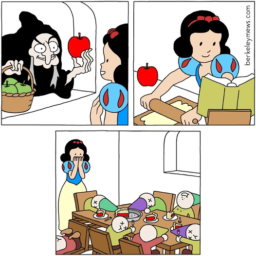

Generated: 
	 Bức tranh được chia thành 3 khung hình. Khung hình đầu tiên ở góc trên bên trái mô tả một người đàn ông với mái tóc đen, mặc áo xanh và đang cầm một quả táo màu đỏ. Người đàn ông đang đứng trước một giỏ rau xanh. Khung hình thứ hai ở góc trên bên phải mô tả một cô bé với mái tóc vàng, mặc áo xanh và đang cầm một chiếc hộp màu xanh lá cây. Cô bé đang đứng trước một bàn gỗ. Khung hình cuối cùng ở góc dưới bên trái mô tả một người phụ nữ với mái tóc trắng, mặc áo xanh và đang đeo tai nghe. Cô ấy đang đứng trước một lớp học với nhiều học sinh đang ngồi học.
Original: 
	 🍎

Label: 3

 27


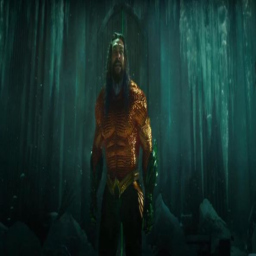

Generated: 
	 Bức ảnh chụp một người đàn ông đang đứng trong một hang động. Anh ta có bộ râu dài và tóc đen, mặc trang phục màu vàng và xanh lá cây. Anh ta đang nhìn về phía trước với vẻ mặt nghiêm nghị. Bối cảnh là một hang động với những tảng đá nhô lên khỏi mặt nước. Nền của bức ảnh có màu xanh lục đậm, tạo cảm giác ấm áp và bí ẩn.
Original: 
	 PHÁT HIỆN VUA BIỂN ATLANTIS ARTHUR CURRY CÙNG EM TRAI ORM LÀM GỎI "CÁ ĐUỐI" BLACK MANTA TRONG AQUAMAN VÀ VƯƠNG QUỐC THẤT LẠC! 
Thấm nhuần tư tưởng quân tử trả thủ 10 năm chưa muộn, "Cá Đuối Đen" Black Manta nay đã quay trở lại trong phần 2 Aquaman cùng với Cây đinh ba đen đi hack của tộc Necrus mà có.
Nếu trong phần trước hai anh em Aquaman và Orm từng combat nhau không khoan nhượng để giành lấy ngai vàng nhà Atlantis thì sang phần 2 sẽ là cảnh cả hai  bắt tay nhau làm gỏi Cá Đuối Đen, thêm chút bia bọt tâm sự, hàn gắn tình huynh đệ.
Phim hiện đang chiếu tại rạp nha
#aquamanvavuongquocthatlac

Label: 0

 28


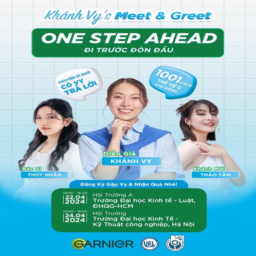

Generated: 
	 Bức ảnh là một poster quảng cáo cho chương trình "Khánh Vy's Meet & Greet ONE STEP AHEAD" với chủ đề "Đi trước đón đầu". Bố cục được chia thành 3 phần chính:

- Phần trên cùng là tiêu đề của chương trình: "Khánh Vy's Meet & Greet ONE STEP AHEAD - ĐI TRƯỚC ĐÓN ĐẦU"
- Phần giữa là hình ảnh của 3 diễn giả: Khánh Vy, Thùy Nhân và Thảo Tâm. Bên cạnh mỗi diễn giả là thông tin về vai trò của họ trong chương trình.
- Phần dưới cùng là thông tin về thời gian và địa điểm tổ chức chương trình: "Đăng Ký Gặp Vy & Nhận Quà Nhé! HỘI TRƯỜNG A
TRƯỜNG ĐẠI HỌC KINH TẾ - LUẬT, DHQG-HCM
HỘI TRƯỜNG
TRƯỜNG ĐẠI HỌC KINH TẾ - KỸ THUẬT CÔNG NGHIỆP, HÀ NỘI
22.04.2024 | 14:00 - 16:00
24.04.2024 | 14:00 - 16:00"

Ngoài ra, bức ảnh còn có logo của các đơn vị tổ chức chương trình: GARNIER, UEL, ...
Original: 
	 KHÁNH VY'S MEET AND GREET | ONE STEP AHEAD: ĐI TRƯỚC ĐÓN ĐẦU - HỌC CÁCH CHỦ ĐỘNG CÙNG KHÁNH VY
Tháng 4 này, Khánh Vy - cô gái đa tài và luôn mang năng lượng tích cực sẽ có 2 buổi Fan Meet &amp; 

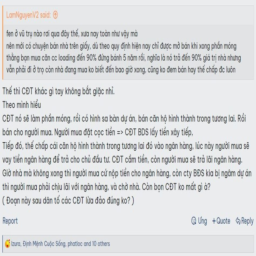

Generated: 
	 Bức ảnh là một đoạn văn bản tiếng Việt được viết theo kiểu chữ in nghiêng. Văn bản được chia thành các đoạn văn ngắn, mỗi đoạn có khoảng 10-12 dòng. Nội dung văn bản xoay quanh chủ đề về việc sử dụng CDT trong giao dịch mua bán hàng hóa. Văn bản được trình bày theo bố cục rõ ràng, dễ đọc, với các tiêu đề được in đậm và các đoạn văn được phân biệt bằng dấu gạch ngang. Ngoài ra, bức ảnh còn có một số thông tin bổ sung như: 
- Tên tác giả: LamNguyenV2
- Tiêu đề bài viết: "LamNguyenV2 said:"
- Số thứ tự bài viết: (Doan này sau dân tố các CDT lừa đảo đúng ko?)
- Nguồn trích dẫn: Izuz, Định Mệnh Cuộc Sống, phatloc and 10 others
- Các nút điều hướng: Ứng, +Quote, Reply
Original: 
	 #VOZ_F33 - Không được vay tiền mua nhà ở hình thành trong tương lai, giới bất động sản lo
https://voz.vn/.../khong-duoc-vay-tien-mua-nha-o-hinh.../

Label: 0

 30


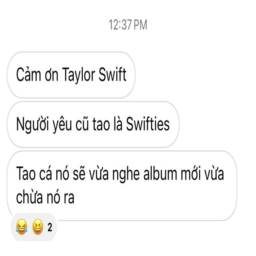

Generated: 
	 Bức ảnh hiển thị một đoạn hội thoại trên điện thoại thông minh. Bố cục được chia thành 3 phần: 
- Phần đầu tiên là tiêu đề "12:37 PM" ở góc trên cùng bên phải.
- Phần thứ hai là nội dung của cuộc hội thoại, bao gồm 3 dòng văn bản:
    - "Cảm ơn Taylor Swift"
    - "Người yêu cũ tao là Swifties"
    - "Tao cá nó sẽ vừa nghe album mới vừa chưa nó ra"
- Phần cuối cùng là biểu tượng cảm xúc và số lượt tương tác với dòng chữ "2".
Original: 
	 Vừa nghe cái miệng vừa giật giật vậy á.

Label: 1

 31


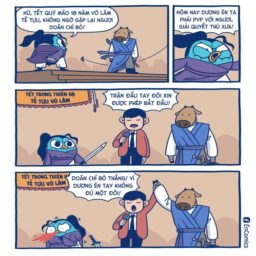

Generated: 
	 Bức ảnh là một trang truyện tranh với 3 khung cảnh khác nhau. Khung cảnh đầu tiên mô tả một người đàn ông mặc áo khoác đỏ đang cầm một thanh kiếm và nói: "Hờ, Tết Quý Mão 18 năm vỡ lâm tề tụu, không ngờ gặp lại người đoàn chí bò!". Khung cảnh thứ hai mô tả một con bò màu xanh da trời đang cười và nói: "Hôm nay Dương én ta phải PVP với người, giải quyết thù xưa!". Khung cảnh cuối cùng mô tả một người đàn ông mặc áo khoác đỏ đang cầm micro và nói: "Trận đấu tay đôi xin được phép bắt đầu! Doãn chí bò thắng! Vì Dương én tay không đủ một đôi!".
Original: 
	 xin lỗi Cô Cô thù này không thể trả!
#VLTK #TetVoLam18 #VoLamTruyenKy #TetTrongThienHa #TeTuuVoLam

Label: 1

 32


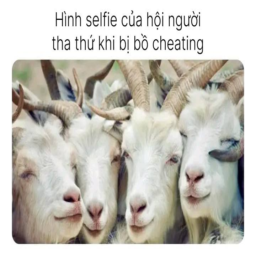

Generated: 
	 Bức ảnh có bố cục đơn giản, với phần trên là tiêu đề "Hình selfie của hội người tha thứ khi bị bồ cheating". Phần dưới là hình ảnh 4 con dê trắng nằm cạnh nhau, nhìn thẳng vào máy ảnh. Hình ảnh được chụp từ góc nghiêng, tạo cảm giác chân thực và gần gũi.
Original: 
	 <username>

Label: 2

 33


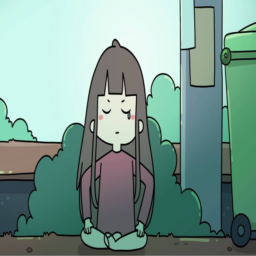

Generated: 
	 Bức ảnh là một hình minh họa đơn giản với một cô gái tóc nâu đang ngồi trên mặt đất. Cô gái mặc áo màu hồng và quần màu xanh lá cây. Cô gái đang cúi xuống, mắt nhắm nghiêng và có vẻ buồn bã. Bên cạnh cô gái là một chiếc thùng rác màu xanh lá cây và một đám mây màu xanh lá cây. Bức ảnh được vẽ theo phong cách hoạt hình vui nhộn.
Original: 
	 Chân thành xin lỗi các bạn đang đợi clip. Quá trình tải lên của bên tui hiện đang bị trục trặc mà ko tìm được lý do. Clip lần này tận 5 phút rưỡi và không có nhãn hàng. Tụi tui cũng rất là muốn lên sớm. Sự cố này thật là vl 🙁 Chúng tui cũng đang rất buồn, nhưng sẽ cố gắng lên clip vào trưa mai. Sorry các bạn lần nữa nhiều lắm ._.

Label: 3

 34


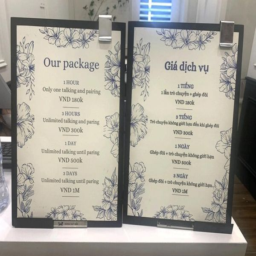

Generated: 
	 Bức ảnh chụp hai bảng giá dịch vụ được đặt cạnh nhau. Bảng bên trái có tiêu đề "Our package" và liệt kê các dịch vụ: 
- 1 HOUR
- 3 HOURS
- Unlimited talking and paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until paring
- Unlimited talking until 

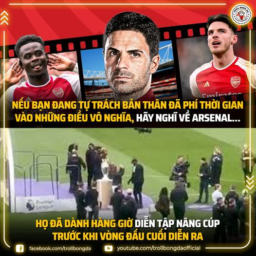

Generated: 
	 Bức ảnh được chia thành 3 phần chính. Phần trên cùng là hình ảnh của 3 cầu thủ bóng đá Arsenal, một cầu thủ đang cười và hai cầu thủ còn lại đang nhìn về phía trước. Phần giữa là dòng chữ "Nếu bạn đang tự trách bản thân đã phí thời gian vào những điều vô nghĩa, hãy nghĩ về Arsenal...". Phần dưới cùng là hình ảnh các cầu thủ đang tập luyện trong sân vận động, với dòng chữ "Họ đã dành hàng giờ để diễn tập nâng cúp trước khi vòng đầu cuối diễn ra" và hai trang facebook và youtube.
Original: 
	 Thật là đau lòng quá đi :(((

Label: 2

 36


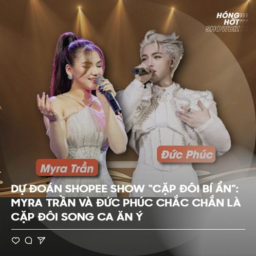

Generated: 
	 Bức ảnh có bố cục đơn giản, với hai nhân vật chính là Myra Trần và Đức Phúc đang biểu diễn trên sân khấu. Bên cạnh họ là dòng chữ "DỰ ĐOÁN SHOPEE SHOW "CẬP ĐỔI BÍ ẨN": MYRA TRẦN VÀ ĐỨC PHÚC CHẮC CHẮN LÀ CẬP ĐỔI SONG CA ĂN Ý". Phía trên cùng bên phải là dòng chữ "HỒNG HOT SHOWTIME" được in đậm.
Original: 
	 Sau khi soi kỹ lại lần nữa dàn lineup “đổ bộ” show âm nhạc “Cặp Đôi Bí Ẩn” của Shopee, ad sẽ phân tích cặp đôi có khả năng “gây bão” nhất!
Chẳng phải tự nhiên mà show “Cặp Đôi Bí Ẩn” của Shopee lại chia đều Myra Trần và Đức Phúc về 2 đội thế đâu. Nếu quán quân của 2 cuộc thi âm nhạc đình đám “chạm trán”, mọi người nghĩ chiến thắng sẽ thuộc về ai?
Myra Trần - quán quân X-Factor Vietnam 2016, nhân tố “gây sốt’ tại The Masked Singer 2022 với “Anh chưa thương em đến vậy đâu”.
Đức Phúc - quán quân The Voice Vietnam 2015, chủ nhân của loạt hit hễ có lễ cưới là lại được reply như “Ánh nắng của anh”, “Hơn cả yêu”, “Ngày đầu tiên”,...
Kẻ 8 lạng người 800gram thế này mà gặp nhau 

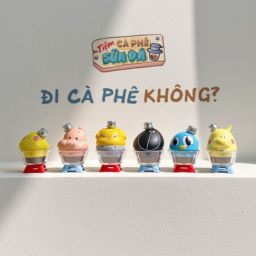

Generated: 
	 Bức ảnh chụp cận cảnh 6 chiếc cốc cà phê nhỏ, được xếp thành hàng ngang trên nền trắng. Mỗi chiếc cốc cà phê có hình dáng giống một con gà trống, với phần thân màu vàng nhạt, phần miệng màu hồng nhạt và phần đầu màu xanh dương nhạt. Trên mỗi chiếc cốc cà phê đều có dòng chữ "Tiệm cà phê sữa đá" được viết bằng font chữ in hoa màu đen, nổi bật trên nền trắng. Dưới cùng của bức ảnh là dòng chữ "ĐI CÀ PHÊ KHÔNG?" được viết bằng font chữ in hoa màu xanh lá cây, tạo cảm giác vui nhộn và thu hút sự chú ý của người xem.
Original: 
	 nếu không may mắn bạn sẽ mua trúng Én

Label: 3

 38


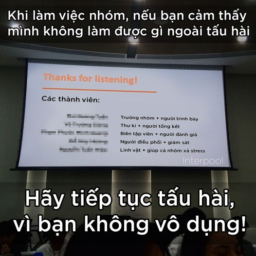

Generated: 
	 Bức ảnh chụp một màn hình LED hiển thị nội dung văn bản tiếng Việt. Ở phần đầu màn hình, có dòng chữ "Khi làm việc nhóm, nếu bạn cảm thấy mình không làm được gì ngoài tấu hài" được viết bằng font chữ in đậm màu đen. Dưới dòng chữ này là tiêu đề "Thanks for listening!" được viết bằng font chữ in đậm màu cam. Tiếp theo là phần liệt kê các thành viên trong nhóm: "Các thành viên:" và liệt kê các chức năng của mỗi thành viên: "Trường nhóm + người trình bày", "Thu kỳ + người tổng kết", "Biên tập viên + người đánh giá", "Người điều phối + giám sát", "Linh vật + giúp cả nhóm xả stress". Cuối cùng là dòng chữ "Interpolool" được viết bằng font chữ in đậm màu đen. Phần cuối màn hình hiển thị dòng chữ "Hãy tiếp tục tấu hài, vì bạn không vô dụng!" được viết bằng font chữ in đậm màu đen.
Original: 
	 Hãy tag một trưởng nhóm và một linh vật xuống đây nhưng không nói ai là trưởng nhóm, ai là linh vật, để chúng nó tự chia role với nhau.
#Interpool
-Ivan

Label: 2

 39


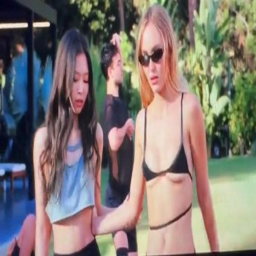

Generated: 
	 Bức ảnh chụp cận cảnh hai người phụ nữ. Người phụ nữ bên trái mặc áo thể thao màu xanh nhạt, quần đen và đang nhìn về phía trước. Người phụ nữ bên phải mặc áo bikini màu đen, đeo kính râm và đang nhìn về phía người phụ nữ bên trái. Bối cảnh là một khu vườn với cây cối xanh mát.
Original: 
	 JENNIE (BLACKPINK) CHÍNH THỨC DEBUT VỚI VAI TRÒ DIỄN VIÊN VỚI BỘ PHIM "THE IDOL" ♥️
Jennie trong vai diễn Dyanne - dancer và bạn thân của nữ chính

Label: 2

 40


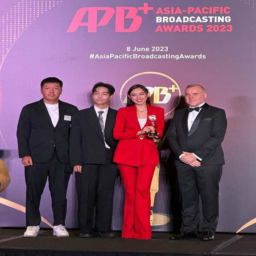

Generated: 
	 Bức ảnh chụp một nhóm 4 người đứng trên sân khấu, phía sau họ là một tấm phông nền màu tím nhạt với dòng chữ "APB+ ASIA-PACIFIC BROADCASTING AWARDS 2023" được in đậm và nổi bật. Phía dưới dòng chữ này là dòng chữ "8 June 2023" và hashtag "#AsiaPacificBroadcastingAwards".  Người đứng ở giữa là một phụ nữ mặc áo đỏ, đang cầm một chiếc cúp màu vàng. Bên cạnh cô là hai người đàn ông khác, một người mặc vest đen và một người mặc vest trắng.
Original: 
	 Đơn vị sản xuất series Đu Đêm METUB cùng hoa hậu Thuỳ Tiên đã chính thức chiến thắng hạng mục Excellence Award of Technology nằm trong giải thưởng Phát thanh và Truyền hình Châu Á - Thái Bình Dương (Asia Pacific Broadcasting Awards 2023)
Giải thưởng Phát thanh và Truyền hình Châu Á - Thái Bình Dương đến từ Singapore tôn vinh những tập thể xuất sắc trong ngành truyền hình phát thanh, công nhận sự đổi mới trong các dự án thúc đẩy lĩnh vực phát thanh truyền hình.

Label: 0

 41


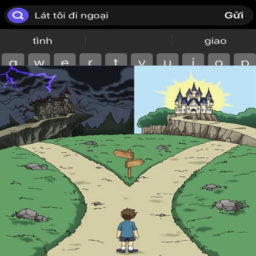

Generated: 
	 Bức ảnh hiển thị giao diện của một ứng dụng máy tính. Giao diện được chia thành hai phần: phần trên là thanh tìm kiếm với dòng chữ "Lát tôi đi ngoại" và thanh gửi với dòng chữ "Gửi". Phần dưới là hình ảnh minh họa cho nội dung của ứng dụng. Hình ảnh mô tả một cậu bé đang đứng giữa một con đường đất nhỏ, hướng về phía một tòa lâu đài lớn ở phía xa. Tòa lâu đài có nhiều cửa sổ và mái vòm, được bao quanh bởi những ngọn núi cao. Phía trước tòa lâu đài là một con đường đất nhỏ, bên cạnh là một bảng chỉ dẫn bằng gỗ. Trên bầu trời có một đám mây màu xanh tím.
Original: 
	 Lúc sếp đi ngủ là lúc tôi đi ngoại giao
#interpool

Label: 3

 42


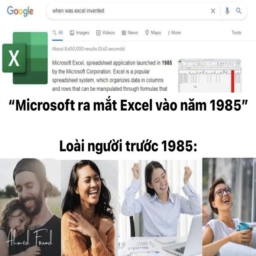

Generated: 
	 Bức ảnh hiển thị một bài viết trên Google với tiêu đề "when was excel invented". Bài viết giới thiệu về Microsoft Excel, một ứng dụng spreadsheets phổ biến được phát triển bởi Microsoft Corporation vào năm 1985. Hình ảnh minh họa cho bài viết bao gồm ba hình ảnh: một người đàn ông đang ôm một đứa trẻ, một người phụ nữ đang cười và vẫy tay, và một người phụ nữ khác đang cầm máy tính xách tay. Dưới cùng của bức ảnh là dòng chữ "Loài người trước 1985:".
Original: 
	 🥹🥹🥹

Label: 2

 43


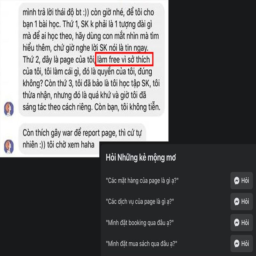

Generated: 
	 Bức ảnh hiển thị một đoạn hội thoại trực tuyến giữa hai người. Phần đầu tiên của bức ảnh là một đoạn văn bản tiếng Việt với nội dung: "Mình trả lời thái độ bt :) còn giờ nhé, để tôi cho bạn 1 bài học. Thứ 1, SK phải là 1 tượng đài gì mà để ai học theo, hãy dùng con mắt nhìn mà tìm hiểu thêm, chứ giờ nghe lời SK nói là tin ngay. Thứ 2, đây là page của tôi, tôi làm cái gì, đó là quyền của tôi, đúng không? Còn thứ 3, tôi đã bảo là tôi học tập SK, tôi thừa nhận, nhưng đó là quá khứ và giờ tôi đã sáng tác theo cách riêng. Còn bạn, tôi không tiễn."
Original: 
	 Ai rồi cũng khát 😞
#interpool

Label: 1

 44


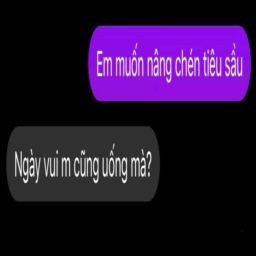

Generated: 
	 Bức ảnh hiển thị hai nút bấm màu sắc khác nhau. Nút màu tím có nội dung "Em muốn nâng chén tiêu sầu" và nút màu xám có nội dung "Ngày vui m cũng uống mà?"
Original: 
	 🙃?

Label: 1

 45


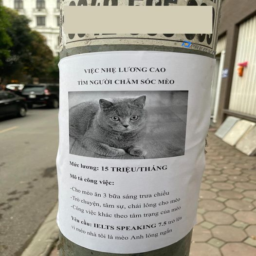

Generated: 
	 Bức ảnh chụp một tờ giấy dán trên cột đèn đường. Tờ giấy có nền trắng, in chữ đen. Phía trên cùng là tiêu đề "VIỆC NHẸ LƯƠNG CAO", tiếp theo là dòng chữ "TÌM NGƯỜI CHĂM SÓC MÈO". Bên dưới là hình ảnh một con mèo màu xám đang nhìn thẳng vào ống kính máy ảnh. Dưới hình ảnh là phần mô tả công việc: "Mức lương: 15 TRIỆU/THÁNG", "Mô tả công việc:" với 3 mục: "Cho mèo ăn 3 bữa sáng trưa chiều", "Trò chuyện, tâm sự, chải lông cho mèo", "Công việc khác theo tâm trạng của mèo". Cuối cùng là phần yêu cầu: "Yêu cầu: IELTS SPEAKING 7.5 trở lên vì mèo nhà tôi là mèo Anh lông ngắn".
Original: 
	 Trông Moè cũng IELTS, áp lực ngang 🥲🥲

Label: 2

 46


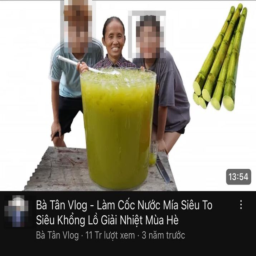

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội với tiêu đề "Bà Tân Vlog - Làm Cốc Nước Mía Siêu To Siêu Khổng Lồ Giải Nhiệt Mùa Hè".  Bức ảnh có bố cục đơn giản, tập trung vào hình ảnh ba người phụ nữ đang cầm cốc nước mía siêu to. Phía sau họ là những cây tre được xếp chồng lên nhau. Bên dưới bức ảnh là thông tin về bài đăng: "Bà Tân Vlog - Làm Cốc Nước Mía Siêu To Siêu Khổng Lồ Giải Nhiệt Mùa Hè Bà Tân Vlog - 11 Tr lượt xem - 3 năm trước".
Original: 
	 Đoạn phim mà anh chị em làm sự kiện không dám xem:

Label: 2

 47


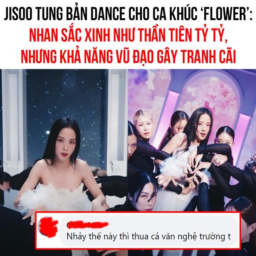

Generated: 
	 Bức ảnh được chia thành hai phần chính. Phần bên trái là hình ảnh một cô gái trẻ với mái tóc đen dài, mặc váy trắng, đang ngồi trên ghế và nhìn về phía máy ảnh. Cô ấy có vẻ rất nghiêm túc và tập trung. Phần bên phải là hình ảnh của một nhóm ca sĩ trẻ tuổi, họ đang biểu diễn trên sân khấu. Họ mặc trang phục màu sắc rực rỡ, tạo cảm giác vui tươi và năng động. Trên bức ảnh có dòng chữ "JISOO TUNG BẢN DANCE CHO CA KHÚC "FLOWER: NHÂN SẮC XINH NHƯ THẦN TIÊN TỶ TỶ, NHƯ KHẢ NĂNG VŨ ĐẠO GÂY TRANH CẢI" được viết bằng font chữ màu đỏ đậm. Phía dưới cùng của bức ảnh có dòng chữ "Nhảy thế này thì thua cả văn nghệ trường t" được viết bằng font chữ màu đỏ nhạt.
Original: 
	 Sau giọng hát, đến khả năng vũ đạo của Jisoo cũng không được đánh giá cao

Label: 2

 48


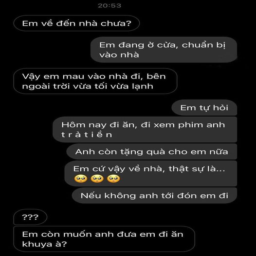

Generated: 
	 Bức ảnh là một đoạn hội thoại trên điện thoại thông minh. Bố cục của bức ảnh được chia thành 3 phần chính:

1. **Phần đầu**: Ghi thời gian通话 là 20:53.
2. **Phần giữa**: Chia thành 4 khung thoại, mỗi khung thoại chứa một câu hỏi hoặc lời thoại liên quan đến cuộc trò chuyện. Các khung thoại được đặt trong các ô vuông màu xám nhạt.
3. **Phần cuối**: Ghi câu hỏi "Em còn muốn anh đưa em đi ăn khuya à?" và hai biểu tượng cảm xúc.

Nội dung văn bản trong ảnh bao gồm:

* **Khung thoại 1**: "Em về đến nhà chưa?"
* **Khung thoại 2**: "Em đang ở cửa, chuẩn bị vào nhà"
* **Khung thoại 3**: "Vậy em mau vào nhà đi, bên ngoài trời vừa tối vừa lạnh"
* **Khung thoại 4**: "Em tự hỏi"
* **Khung thoại 5**: "Hôm nay đi ăn, đi xem phim anh trả tiền"
* **Khung thoại 6**: "Anh còn tặng quà cho em nữa"
* **Khung thoại 7**: "Em cứ vậy về nhà, thật sự là..."
* **Khung thoại 8**: "Nếu không anh tới đón em đi"
* **Khung thoại 9**: "???"
* **Khung thoại 10**: "Em còn muốn anh đưa em đi ăn khuya à?"
Or

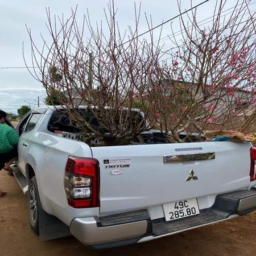

Generated: 
	 Bức ảnh chụp cận cảnh phần đuôi của một chiếc xe hơi màu trắng. Xe có biển số 49C 285.80. Phía sau xe là một cây hoa đào nở rộ. Trên thân xe có dòng chữ "TRITON" được in nổi bật.
Original: 
	 Khoe hình bán tải chở Đào, chở Mai của con giời ở đây. Sao toàn Trai Tân hok zị ta???
Bộ Đức Dua hok ăn tết hay gì???
Thân ái,

Label: 3

 50


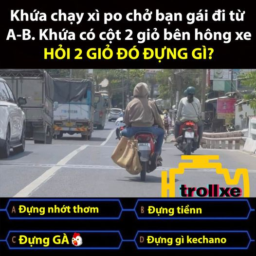

Generated: 
	 Bức ảnh có bố cục đơn giản, tập trung vào câu hỏi "Khứa chạy xì po chở bạn gái đi từ A-B. Khứa có cột 2 giờ bên hông xe HỎI 2 GIỜ ĐỪNG GÌ?" được viết bằng chữ in đậm màu đen ở phần trên của bức ảnh. Bên dưới câu hỏi là hình ảnh minh họa cho câu hỏi với ba lựa chọn trả lời được đánh dấu bằng các chữ cái A, B, C. Lựa chọn A là "Dùng nhớt thơm", lựa chọn B là "Dùng tiền", và lựa chọn C là "Dùng GÀ". Phía dưới cùng của bức ảnh là dòng chữ "trollxe" được viết bằng chữ in đậm màu vàng.
Original: 
	 Trả lời. NHANHHH

Label: 2

 51


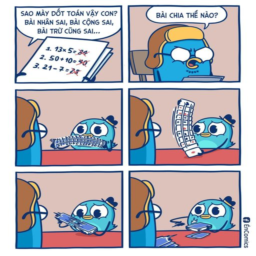

Generated: 
	 Bức ảnh được chia thành 4 khung hình nhỏ, mỗi khung hình mô tả một nhân vật khác nhau. Khung hình đầu tiên có tiêu đề "SAO MÀY ĐỐT TOÁN VẬY CON? BÀI NHÂN SAI, BÀI CÔNG SAI, BÀI TRỪ CŨNG SAI...". Khung hình thứ hai có tiêu đề "BÀI CHIA THẾ NÀO?" và minh họa một nhân vật màu xanh dương với khuôn mặt buồn bã đang nói: "13x5=36, 50+10=60, 21-7=14". Khung hình thứ ba có nội dung: "13x5=36, 50+10=60, 21-7=14". Khung hình cuối cùng có nội dung: "13x5=36, 50+10=60, 21-7=14".
Original: 
	 dzô

Label: 2

 52


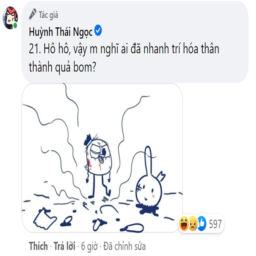

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội với tiêu đề "Tác giả" và nội dung: "Huỳnh Thái Ngọc 21. Hổ hổ, vậy m nghĩ ai đã nhanh trí hóa thân thành quả bom?". Bên dưới là hình minh họa hai nhân vật được vẽ theo phong cách hoạt hình đơn giản. Nhân vật bên trái là một người con trai có khuôn mặt buồn bã, đang cầm một chiếc túi xách và nhìn về phía trước. Nhân vật bên phải là một con thỏ nhỏ, đang cười rạng rỡ. Phía dưới hình minh họa là dòng chữ "Thích - Trả lời - 6 giờ - Đã chỉnh sửa".
Original: 
	 [Update phốt Thỏ và <username> ]
 Sau 3 ngày 3 đêm xô xát liên tục, diễn biến của cuộc ẩu đả online giữa chúng tôi trở nên phức tạp hơn, không thể gọi cơ quan chức năng can thiệp, vụ gây rối trật tự công cộng online này đã dần tiến đến hồi kết. Kính mời các bạn đón đọc kỳ 2 
- Comic Tự Lực Đoàn đưa tin

Label: 0

 53


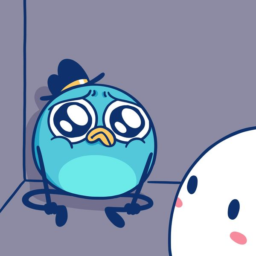

Generated: 
	 Hình ảnh là một nhân vật hoạt hình với bộ lông màu xanh dương nhạt. Nhân vật này có đôi mắt to tròn, khuôn mặt vui vẻ và đang nhìn về phía bên phải. Phía sau nhân vật là một bức tường màu tím nhạt.
Original: 
	 Mot cai ket co hau
mon.

Label: 3

 54


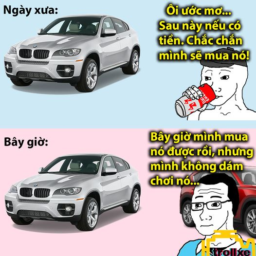

Generated: 
	 Bức ảnh được chia thành 3 phần, mỗi phần là một hình ảnh minh họa cho một sự việc khác nhau. Phần trên bên trái là hình ảnh một chiếc xe hơi màu bạc với dòng chữ "Ngày xưa:" ở phía trên. Bên cạnh là dòng chữ "Ối ước mơ... Sau này nếu có tiền. Chắc chắn mình sẽ mua nó!". Phần trên bên phải là hình ảnh một người đàn ông với dòng chữ "Bây giờ:" ở phía trên. Bên cạnh là dòng chữ "Bây giờ mình mua nó được rồi, nhưng mình không dám chơi nó...". Phần dưới bên trái là hình ảnh một chiếc xe hơi màu bạc với dòng chữ "Ngày xưa:" ở phía trên. Bên cạnh là dòng chữ "Ối ước mơ... Sau này nếu có tiền. Chắc chắn mình sẽ mua nó!". Phần dưới bên phải là hình ảnh một chiếc xe hơi màu đỏ với dòng chữ "Bây giờ:" ở phía trên. Bên cạnh là dòng chữ "Bây giờ mình mua nó được rồi, nhưng mình không dám chơi nó...".
Original: 
	 Tại sao yêu nhau không đến được với nhau 🎶
Đến làm chi... hai ta phải khổ đau 🎶

Label: 1

 55


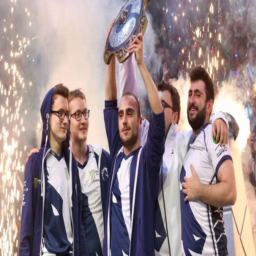

Generated: 
	 Bức ảnh chụp bốn người đàn ông trong trang phục áo thun màu xanh dương và trắng. Họ đang đứng trên sân khấu, phía sau họ là một khán đài với rất nhiều sương mù và pháo hoa. Người đàn ông ở giữa đang giơ cao một chiếc vương miện có hình con rùa. Trên áo của anh ta có in dòng chữ "Mét" và logo của một công ty. Bên cạnh anh ta là một người đàn ông khác cũng đang giơ cao một chiếc vương miện. Cả ba người đàn ông đều có vẻ mặt vui mừng và tự hào. Bức ảnh được chụp từ góc nghiêng, cho phép người xem nhìn thấy toàn bộ khuôn mặt và trang phục của những người trong ảnh.
Original: 
	 CHÚC MỪNG TEAM LULQUIT ĐÃ NÂNG KHIÊN AEGIS THE INTERNATIONAL !!!!!!
Một mình chống lại cả Thiên Triều và Team Liquid đã trở thành tân chủ nhân của chiếc khiên Aegis !!!!
Quá tuyệt vời MATUMBAMAN và các đồng đội. Những con người này và Team Liquid đã làm nên lịch sử cho riêng mình và được biết trong tương lai, Kuroky đang suy tính đến việc thay đổi màu áo.
Có lẽ màu tím rất hợp phong thủy và chúc các an

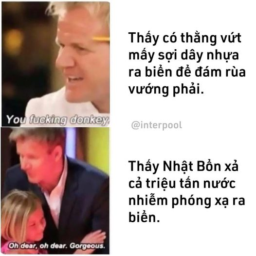

Generated: 
	 Bức ảnh được chia thành hai phần chính. Phần bên trái là một bức ảnh chụp một người đàn ông đang nói chuyện với một người phụ nữ. Người đàn ông đang cười và nói: "You fucking donkey". Người phụ nữ đang nhìn vào người đàn ông và nói: "Oh dear, oh dear. Gorgeous.". Phần bên phải của bức ảnh là hai đoạn văn bản tiếng Việt. Đoạn văn bản đầu tiên có nội dung: "Thấy có thằng vứt mấy sợi dây nhựa ra biển để đám rùa vướng phải.". Đoạn văn bản thứ hai có nội dung: "Thấy Nhật Bồn xả cả triệu tấn nước nhiễm phóng xạ ra biển."
Original: 
	 -The Deep
#Interpool

Label: 2

 57


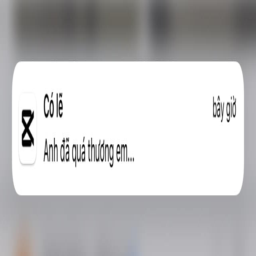

Generated: 
	 Bức ảnh hiển thị một nút bấm màu trắng với dòng chữ "Có lễ" ở bên trái và dòng chữ "Anh đã quá thương em..." ở bên phải. Dòng chữ "Có lễ" được viết bằng font chữ đen đậm, trong khi dòng chữ "Anh đã quá thương em..." được viết bằng font chữ đen thường.
Original: 
	 Uh. Cảm ơn vì làm mừng hụt.

Label: 1

 58


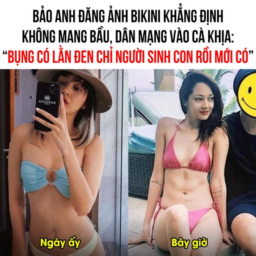

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau. Bên trái là hình ảnh một người phụ nữ mặc áo bikini màu xanh dương, đang cầm điện thoại và nhìn về phía máy ảnh. Bên phải là hình ảnh một người phụ nữ khác cũng mặc áo bikini màu hồng, đang ngồi trên ghế và nhìn về phía máy ảnh. Cả hai hình ảnh đều có dòng chữ "Ngày ấy" và "Bây giờ" ở phía dưới. Phía trên cùng của bức ảnh là dòng chữ "BẢO ANH ĐĂNG ẢNH BIKINI KHẲNG ĐỊNH KHÔNG MANG BẦU, DÂN MẠNG VÀO CÀ KHIA: "BỤNG CÓ LẦN ĐEN CHỈ NGƯỜI SINH CON RỒI MỚI CÓ""
Original: 
	 Dân mạng thật cố chấp

Label: 2

 59


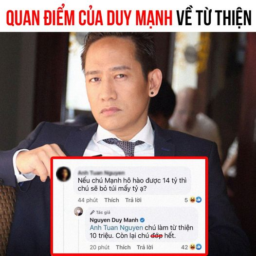

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội với tiêu đề "QUAN ĐIỂM CỦA DUY MẠNH VỀ TỪ THIỆN".  Bài đăng có hình ảnh một người đàn ông mặc vest, đang chỉ tay vào phần nội dung của bài đăng. Phần nội dung chính của bài đăng là một đoạn trích dẫn từ bài viết của tác giả Nguyễn Duy Mạnh: "Nếu chú Mạnh hô được 14 tỷ thì chú sẽ bỏ túi mấy tỷ à?" và câu trả lời của tác giả: "Anh Tuấn Nguyên chủ làm từ thiện 10 triệu. Còn lại chú đẹp hết."
Original: 
	 Đấy phải thẳng như chú Mạnh ai nói gì đâu 😂

Label: 1

 60


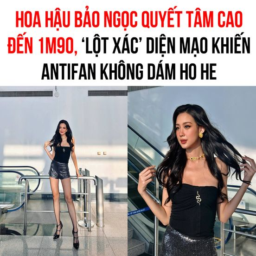

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau. Phần bên trái là hình ảnh một người phụ nữ trẻ đang tạo dáng trên cầu thang, cô ấy mặc một chiếc váy màu đen và có mái tóc đen dài. Phần bên phải là hình ảnh một người phụ nữ khác cũng đang tạo dáng trên cầu thang, cô ấy mặc một chiếc váy màu đen và có mái tóc đen dài. Trên cùng của bức ảnh là dòng chữ "HOA HẬU BẢO NGỌC QUYẾT TÂM CAO ĐẾN 1M90, "LỢT XÁC" DIỆN MẠO KHIẾN ANTIFAN KHÔNG ĐÁM HO HE".
Original: 
	 Hào quang hoa hậu ngày càng tỏa ra rồi đó!

Label: 0

 61


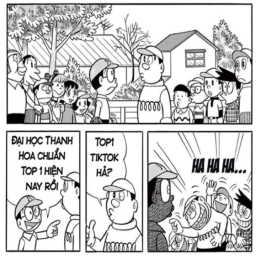

Generated: 
	 Bức ảnh được chia thành 3 khung hình. Khung hình đầu tiên ở phía trên bên trái mô tả một nhóm người đang đứng trước một ngôi nhà, trong đó có một người đàn ông mặc áo sơ mi trắng và đội mũ lưỡi trai, hai người phụ nữ mặc áo sơ mi trắng và đội mũ lưỡi trai, một người đàn ông mặc áo sơ mi trắng và đội mũ lưỡi trai, hai người phụ nữ mặc áo sơ mi trắng và đội mũ lưỡi trai, một người đàn ông mặc áo sơ mi trắng và đội mũ lưỡi trai, hai người phụ nữ mặc áo sơ mi trắng và đội mũ lưỡi trai, một người đàn ông mặc áo sơ mi trắng và đội mũ lưỡi trai, hai người phụ nữ mặc áo sơ mi trắng và đội mũ lưỡi trai, một người đàn ông mặc áo sơ mi trắng và đội mũ lưỡi trai, hai người phụ nữ mặc áo sơ mi trắng và đội mũ lưỡi trai, một người đàn ông mặc áo sơ mi trắng và đội mũ lưỡi trai, hai người phụ nữ mặc áo sơ mi trắng và đội mũ lưỡi trai, một người đàn ông mặc áo sơ mi trắng và đội mũ lưỡi trai, hai người phụ nữ mặc áo sơ mi trắng và đội mũ lưỡi trai, một người đàn ông mặc áo sơ mi trắng và

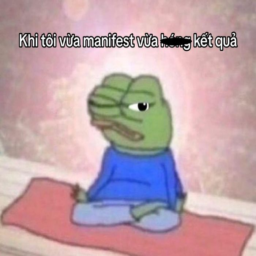

Generated: 
	 Bức ảnh là một meme với hình ảnh một con ếch màu xanh lá cây đang ngồi trên một tấm thảm màu hồng. Con ếch có vẻ đang suy nghĩ và nhìn về phía trước. Trên đầu con ếch là dòng chữ "Khi tôi vừa manifest vừa hồng kết quả".
Original: 
	 Ngó thử tí chứ không đợi được 🤭

Label: 1

 63


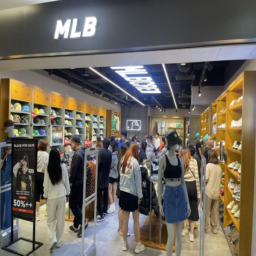

Generated: 
	 Bức ảnh chụp một cửa hàng thời trang với biển hiệu "MLB" được viết bằng chữ trắng nổi bật trên nền đen. Cửa hàng có nhiều kệ trưng bày sản phẩm, chủ yếu là các loại mũ và giày dép. Có rất nhiều người đang mua sắm trong cửa hàng. Bên cạnh đó, còn có một bảng hiệu quảng cáo với dòng chữ "BLACK FIVE DAYS 50%++".
Original: 
	 10h đêm nhưng các chị em vẫn vui như trẩy hội ở Vincom Center Bà Triệu, Vincom Center Landmark 81 &amp; Vincom Center Đồng Khởi 💃
Khả năng cao quỹ đen của anh em và thứ 6 đen trùng tên là có lí do 😇
À cho bác nào chưa biết, Vincom Center Bà Triệu, Vincom Center Đồng Khởi &amp; Vincom Center Landmark 81  sẽ mở cửa đến tận 23h đêm duy nhất trong ngày Black Friday 24.11, nên các chị em cứ thoải mái càn quét đi nhé, ae chúng tôi chờ dc 🥶
#Vincom #VincomBlackFriday2023 #Toyderland

Label: 3


In [ ]:
train_label_counts = {
    0: 0, 1: 0, 2: 0, 3:0,
}

for batch in train_loader:
    images              = batch['image']
    generated_captions  = batch['generated_caption']
    captions            = batch['caption']
    labels              = batch['label']

    for i in range(len(images)):
        print('\n', i)
        display(transforms.ToPILImage()(images[i]))

        print('Generated: \n\t', generated_captions[i])
        print('Original: \n\t', captions[i])

        train_label_counts[labels[i].item()] += 1
        print('\nLabel:', labels[i].item())

    break

In [ ]:
for key, value in train_label_counts.items():
    print(key, '\n', value)

0 
 10
1 
 15
2 
 19
3 
 20



 0


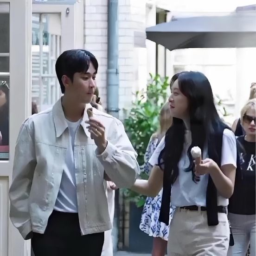

Generated: 
	 Bức ảnh chụp một cặp đôi đang đi bộ trên đường. Người đàn ông mặc áo khoác trắng và quần đen, người phụ nữ mặc áo sơ mi trắng và quần màu be. Cả hai đều có mái tóc đen dài và nhìn thẳng vào ống kính. Bên cạnh họ là một người phụ nữ khác cũng mặc áo trắng và quần màu be. Bức ảnh được chụp từ góc nghiêng, tạo cảm giác chân thực và gần gũi. Không có bất kỳ văn bản nào được tìm thấy trong bức ảnh.
Original: 
	 Bức ảnh này của Kim Soo-hyun và Kim Ji-won được cho biết không phải chụp trong một cảnh quay. Cả hai thực sự rất thoải mái vui vẻ khi ở cạnh nhau, kể cả khi không có camera và thân phận Hyunwoo - Haein.

Label: 0

 1


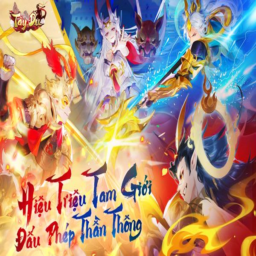

Generated: 
	 Bức ảnh là một poster quảng cáo cho bộ game "Tây Du". Bố cục của poster được thiết kế theo phong cách hiện đại, với màu sắc rực rỡ và hình ảnh sinh động. Ở trung tâm là dòng chữ "Hiệu Triệu Tam Giới" được viết theo kiểu chữ nghệ thuật màu đỏ, nổi bật trên nền vàng. Dưới dòng chữ này là dòng chữ "Đấu Phép Thần Thống" cũng được viết theo kiểu chữ nghệ thuật màu xanh dương. Các nhân vật trong poster được vẽ theo phong cách hoạt hình, tạo cảm giác vui nhộn và thu hút sự chú ý của người xem.
Original: 
	 HƠN 400 NĂM KỂ TỪ KHI ĐƯỢC SÁNG TÁC VÀ ĐÃ GẦN 40 NĂM KỂ TỪ KHI TÂY DU KÝ XUẤT HIỆN TRÊN MÀN ẢNH NHỎ TV!
Cứ nhắc về Tây Du Kí thì tuổi thơ của chúng ta sẽ lại ùa về với biết bao kỉ niệm đẹp đến nao lòng.
Đó là cái thời TV vẫn còn được gọi là Vô Tuyến. Đó là thời bố chỉnh ăng ten, con ngồi dò sóng. Đó là thời 1 nghìn bằng cả bữa ăn và đó là thời cứ mỗi mùa hè về thì tất cả lũ trẻ con chúng tôi đều ước mình được làm Tôn Ngộ Không, được làm Tề Thiên Đại Thánh, được làm Mỹ Hầu Vươn

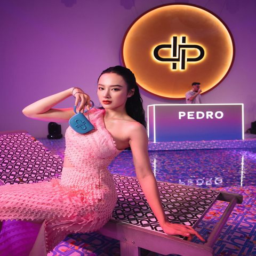

Generated: 
	 Bức ảnh chụp một người phụ nữ trẻ mặc váy hồng đang tạo dáng trước camera. Cô ấy đang cầm một chiếc túi xách màu xanh dương. Bối cảnh là một căn phòng với tông màu tím nhạt, có một vòng tròn sáng màu cam ở phía trên bên phải của bức ảnh. Bên dưới vòng tròn là dòng chữ "PEDRO" được in trên nền trắng.
Original: 
	 DÀN IDOL KHOE DÁNG KEO LỲ TẠI TIỆC HÈ SẮC MÀU “A SUMMER SOIREE WITH PEDRO” 
9/6/2023 vừa qua, nhiều gương mặt nổi tiếng trong showbiz đã có dịp quy tụ trong sự kiện độc đáo giới thiệu BST mới nhất PEDRO Icon Summer 2023.. 
Ca sĩ Min cùng Thiều Bảo Trâm cùng chọn style Black on Black từ outfits đến túi xách và giày của BST PEDRO Icon, những items mới nhất trong hè này. Trong khi Thiều Bảo Trâm khoe khéo đôi chân thon trên giày cao gót mũi nhọn nữ tính, thì Min trông keo lỳ hơn mọi khi với giày cao gót đế to bản, kết hợp túi vầng trăng khuyết màu silver huyền bí. Không chỉ tham gia sự kiện, Thiều Bảo Trâm còn tặng khán giả phần biểu diễn sôi động và mãn nhẵn. 
Đặc b

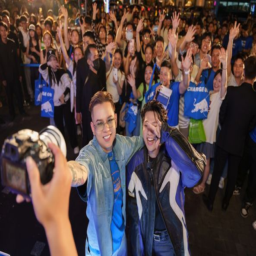

Generated: 
	 Bức ảnh chụp một nhóm người đang vui mừng, họ đang giơ tay lên và cười rạng rỡ. Ở giữa bức ảnh là hai người đàn ông, một người mặc áo sơ mi màu xanh dương và áo khoác màu đen, người kia mặc áo sơ mi màu xanh dương và áo khoác màu trắng. Người đàn ông mặc áo sơ mi màu xanh dương và áo khoác màu đen đang cầm máy ảnh để chụp hình. Phía sau họ là một hàng người đông đúc, họ cũng đang giơ tay lên và cười rạng rỡ. Trên áo của một số người có dòng chữ "CHARGED".
Original: 
	 Đầu cầu Sài Gòn chuyến này ăn lễ chấn động, Red Bull được gọi tên vì quá “chiều chuộng” anh em
Bắt gặp hình ảnh đông đúc của người dân đi chơi lễ tại Bến Bạch Đằng hôm qua, hỏi ra mới biết mọi người đổ xô về đây để hóng 2 rappers Andree, Obito cùng cặp đôi Huyme - Hàn Hằng quẩy nhạc “đùng đùng”, vừa ăn kem uống nước vừa ngắm dàn drone đổ bộ chiếm trọn spotlight trời đêm. Khó quên nhất có lẽ là tiếng hô đồng thanh “HÚC TỚI ĐI” để khởi động màn trình diễn, chắc chuyến này nghỉ lễ xong ai cũng mạnh mẽ “húc sếp”

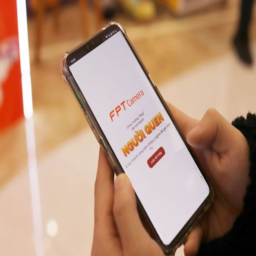

Generated: 
	 Bức ảnh chụp cận cảnh một chiếc điện thoại thông minh đang được cầm bởi một bàn tay. Màn hình điện thoại hiển thị giao diện ứng dụng FPT Camera với dòng chữ "Chúc mừng "Duy" đến thành người quen". Dưới dòng chữ này là dòng chữ "NGƯỜI QUEN" được viết theo kiểu chữ in hoa cỡ lớn, màu cam nổi bật trên nền trắng. Phía dưới cùng của màn hình có nút "Lưu và mua" màu đỏ.
Original: 
	 MỌI PHÉP MÀU ĐỀU CÓ THỂ XẢY ĐẾN TRONG ĐÊM GIÁNG SINH !!!
Đêm nay là đêm Giáng Sinh. Người ta thường bảo rằng trong ngày Chúa ra đời, phép màu nào cũng có thể xảy ra và với tôi thì...tôi đã được chứng kiến 2 phép màu liên tiếp. 
Với chương trình "Noel từ lạ thành quen", FPT Camera đã cho tôi thấy sự nhiệm màu của công nghệ AI Việt Nam khi mang tới trải nghiệm Giáng Sinh 4.0 ra giữa trung tâm thương mại rồi bằng cách nào đó, tất cả mọi người đang từ lạ hơ lạ hoặc, bỗng nhiên thân quen để rồi tặng nhau muôn vào tấm thiệp cùng hàng vạn lời chúc ý nghĩa. Công nghệ không làm chúng ta xa cách, mà giúp kết 

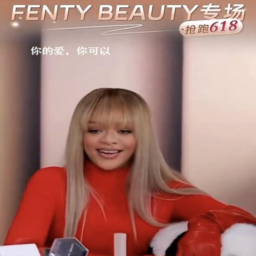

Generated: 
	 Bức ảnh chụp một cô gái trẻ với mái tóc dài màu vàng đang ngồi trên ghế. Cô ấy mặc một chiếc áo len màu đỏ và đang mỉm cười. Phía trên đầu cô gái là dòng chữ "Fenty Beauty专场" được viết bằng tiếng Anh, bên cạnh là số "618" được viết bằng tiếng Trung. Dòng chữ "你爱，你可以" được viết bằng tiếng Trung, có nghĩa là "Bạn yêu, bạn có thể".
Original: 
	 Rihanna gia nhập mảng KOC livestream chốt đơn trên một ứng dụng của Trung Quốc, sẵn sàng cho những phiên live nghìn tỷ.

Label: 0

 6


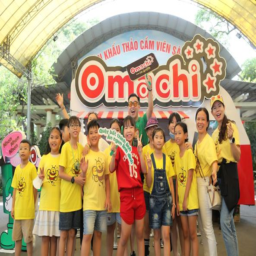

Generated: 
	 Bức ảnh chụp một nhóm trẻ em đang đứng trước một tấm biển quảng cáo. Tấm biển có dòng chữ "Khẩu Thảo Cẩm Viên Sà Omachi" được viết bằng chữ in hoa màu đỏ nổi bật trên nền trắng. Phía trên tấm biển là hình ảnh một đám mây với những ngôi sao nhỏ, tạo cảm giác vui tươi và rực rỡ. Nhóm trẻ em trong ảnh đều mặc áo màu vàng, thể hiện sự vui vẻ và năng động. Một số trẻ em đang giơ hai ngón tay lên, thể hiện niềm vui và tự hào. Bức ảnh được chụp từ góc nghiêng, giúp người xem có cái nhìn tổng quan về toàn bộ khung cảnh.
Original: 
	 CIIN VÀ GIA ĐÌNH AN NHIÊN BỐI BỐI “QUẬY TƯNG BỪNG” BẤT PHÂN THẮNG BẠI VỚI BIỆT ĐỘI OMACHI TẠI THẢO CẦM VIÊN???
Ngày 06/05, TikToker CiiN và gia đình An Nhiên Bối Bối chia sẻ khoảnh khắc nhảy cực vui tại Thảo Cầm Viên. Đáng chú ý, khách tham quan còn ghi lại hình ảnh những mascot kì lạ xuất hiện trong màn dance battle nhí nhố lầy lội và đáng yêu này gồm Cà Chua, Trứng, Khoai Tây, Thịt Bò và Phô Mai.
Theo tin mật báo thì đây là 5 thành viên lầy lội của 

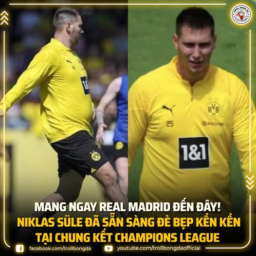

Generated: 
	 Bức ảnh được chia thành hai phần chính. Phần bên trái là hình ảnh của một cầu thủ bóng đá mặc áo đấu màu vàng, đang đứng trên sân cỏ. Phần bên phải là hình ảnh của một cầu thủ bóng đá mặc áo đấu màu vàng, đang đứng trên sân cỏ. Cả hai hình ảnh đều có dòng chữ "MANG NGAY REAL MADRID ĐẾN ĐÂY!" và "NIKLAS SULE ĐÃ SẴN SÀNG ĐỂ BÈP KIÊN KIÊN TẠI CHUNG KẾT CHAMPIONS LEAGUE". Dưới cùng của bức ảnh là thông tin liên lạc của Facebook và Youtube: facebook.com/trollbongdaobad@gmail.com và youtube.com/trollbongdaobadofficial.
Original: 
	 Đối thủ nặng kí :)))

Label: 0

 8


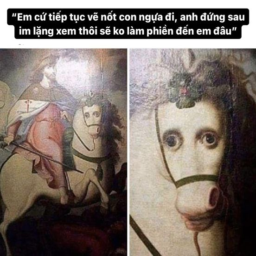

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau. Phần bên trái là một bức tranh sơn dầu với hình ảnh một người đàn ông cưỡi ngựa, phía sau người đàn ông là một con ngựa màu vàng. Bức tranh được vẽ theo phong cách cổ điển, với những đường nét uốn lượn và màu sắc rực rỡ.  Phần bên phải là một bức tranh chân dung của một người đàn ông, được vẽ theo phong cách nghệ thuật hiện đại. Bức tranh này có thể được xem là một minh họa cho câu tục ngữ "Em cứ tiếp tục vẽ nốt con ngựa đi, anh đứng sau im lặng xem thôi sẽ ko làm phiền đến em đâu".
Original: 
	 Đứng quanh em là phiền rồi anh 🥹

Label: 1

 9


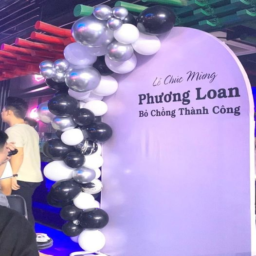

Generated: 
	 Bức ảnh chụp một lối đi được trang trí bằng bóng bay màu đen và trắng. Ở giữa lối đi là một tấm bảng màu tím nhạt với dòng chữ "Lễ Chúc Mừng Phương Loan Bỏ Chồng Thành Công" được viết theo kiểu chữ nghệ thuật. Phía trên bảng là một cột băng rôn màu đỏ và xanh lá cây, tạo nên một khung cảnh vui tươi và rực rỡ.
Original: 
	 Chị Loan có ở đây không nhỉ 😅

Label: 0

 10


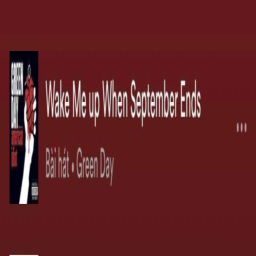

Generated: 
	 Bức ảnh có nền màu đỏ đậm. Ở góc trên bên trái là hình ảnh một cuốn sách với tiêu đề "GREEN DAY" và dòng chữ "american idiot". Bên phải cuốn sách là dòng chữ "Wake Me Up When September Ends" được viết bằng font chữ trắng, cỡ chữ lớn. Dưới dòng chữ này là dòng chữ "Bài hát - Green Day" được viết bằng font chữ trắng, cỡ chữ nhỏ hơn.
Original: 
	 Vâng dậy đi ạ hết r

Label: 0

 11


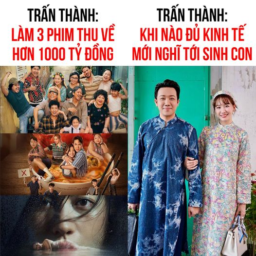

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau, mỗi phần là một hình ảnh riêng biệt. Phần bên trái có tiêu đề "TRẦN THÀNH: LÀM 3 PHIM THU VỀ HƠN 1000 TỶ ĐỒNG" và phần bên phải có tiêu đề "TRẦN THÀNH: KHI NÀO ĐỦ KINH TẾ MỚI NGHĨ TÔI SINH CON". Cả hai phần đều có hình ảnh minh họa cho nội dung văn bản. Phần bên trái có hình ảnh một nhóm người đang chụp ảnh, phần bên phải có hình ảnh một người đàn ông mặc áo dài màu xanh dương và một người phụ nữ mặc váy hoa.
Original: 
	 Không biết bao nhiêu mới là đủ

Label: 0

 12


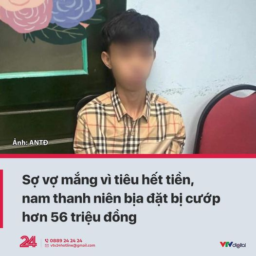

Generated: 
	 Bức ảnh có bố cục đơn giản, tập trung vào một người đàn ông ngồi trên ghế. Người đàn ông mặc áo sơ mi kẻ ca rô và đang nhìn về phía máy ảnh. Bức ảnh được chụp từ góc nghiêng, tạo cảm giác gần gũi và thân thiện. Phía dưới chân người đàn ông là dòng chữ "Ảnh: ANTD". Phía dưới cùng của bức ảnh là thông tin liên lạc của VTV Digital, bao gồm số điện thoại, email và địa chỉ website.
Original: 
	 Công an quận Tây Hồ, Hà Nội cho biết đã làm rõ vụ việc một người dân trình báo bị 6 đối tượng đi trên 3 xe máy gây ra vụ cướp táo tợn trên đê An Dương Vương, xác định đây là thông tin bịa đặt.
Trước đó, vào 3h10 ngày 14/5, Công an phường Phú Thượng nhận được tin báo của anh Đ.B.T (sinh năm 2001; ở xã Phượng Dực, huyện Phú Xuyên, Hà Nội; hiện ở quận Bắc Từ Liêm, Hà Nội) về việc bị 6 người đi trên 3 xe máy cướp tài sản tại khu vực đường đê trước số 142 An Dương Vương.
Tài sản bị cướp gồm 1 chiếc túi bên trong có 1 chiếc điện thoại di động iPhone và 50 triệu đồng tiền mặt. Tổng trị giá tài

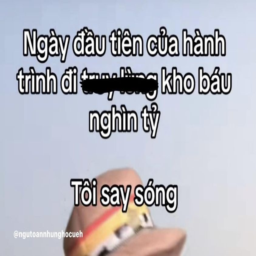

Generated: 
	 Bức ảnh có bố cục đơn giản, với nền màu xanh nhạt. Ở phần trên cùng là dòng chữ "Ngày đầu tiên của hành trình đi truy lùng kho báu nghìn tỷ" được viết theo kiểu chữ in đậm, cỡ chữ lớn. Dưới dòng chữ này là hình ảnh một bàn tay đang cầm một tờ giấy ghi dòng chữ "Tôi say sóng". Phía dưới cùng bên trái là dòng chữ "@ngutoannhunghocueh" được viết theo kiểu chữ in nghiêng, cỡ chữ nhỏ hơn.
Original: 
	 Có lòng nhưng không có sức 🙏

Label: 1

 14


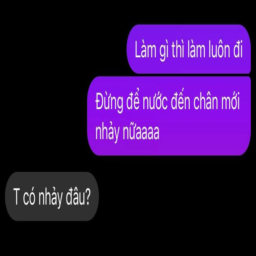

Generated: 
	 Bức ảnh có nền đen, 3 ô hình chữ nhật màu tím nhạt xếp chồng lên nhau. Ô trên cùng có nội dung: "Làm gì thì làm luôn đi". Ô thứ hai có nội dung: "Đừng để nước đến chân mới nhảy nữaaaaaa". Ô dưới cùng có nội dung: "T có nhảy đâu?"
Original: 
	 Ờ thì 👀

Label: 1

 15


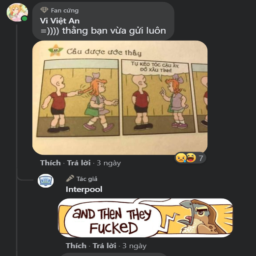

Generated: 
	 Bức ảnh là một phần giao diện của một ứng dụng mạng xã hội, có thể là Facebook hoặc Instagram. Nó hiển thị một bức ảnh minh họa với hai nhân vật hoạt hình đang nói chuyện với nhau. Bức ảnh được chia thành hai khung hình riêng biệt, mỗi khung hình chứa một đoạn văn bản tiếng Việt. Khung hình bên trái có tiêu đề "Cầu được ước thấy" và nội dung: "Tự kéo tóc cậu ấy đồ xấu tính!". Khung hình bên phải có tiêu đề "Thích - Trả lời - 3 ngày" và nội dung: "Tác giả: Interpool Thích - Trả lời - 3 ngày".
Original: 
	 Như cái tên, đây là album tổng hợp những khoảnh khắc And then they fμcked bị nguyền rủa.
#Interpool

Label: 1

 16


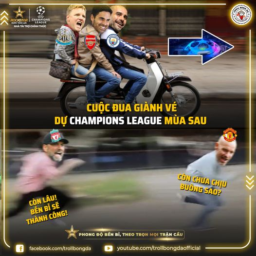

Generated: 
	 Bức ảnh là một poster quảng cáo cho cuộc đua giành vé dự Champions League mùa sau. Bố cục của poster được chia thành 3 phần chính:
- Phần trên cùng là hình ảnh 3 cầu thủ bóng đá đang lái xe máy, thể hiện sự vui mừng và phấn khích.
- Phần giữa là dòng chữ lớn "CUỘC ĐUA GIÀNH VỀ DỰ CHAMPIONS LEAGUE MÙA SAU" với phông chữ màu vàng nổi bật trên nền đen.
- Phần dưới cùng là thông tin liên lạc của Facebook và Youtube, bao gồm địa chỉ facebook.com/trollbongda và youtube.com/trollbongdaofficial.
Original: 
	 Man United và Liverpool cạnh tranh cho chiếc vé cuối cùng.
Ai sẽ là người bền bỉ hơn?
#NướctănglựcRockstar #Bền

Label: 0

 17


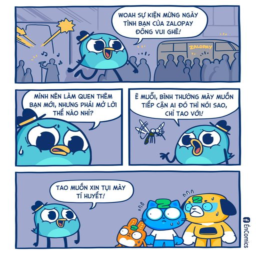

Generated: 
	 Bức ảnh được chia thành 3 khung hình, mỗi khung hình là một câu chuyện riêng biệt. Khung hình đầu tiên mô tả một chú chim màu xanh đang cười và nói: "Woah sự kiện mừng ngày tình bạn của ZaloPay đông vui ghê!". Khung hình thứ hai mô tả một chú chim màu xanh đang cười và nói: "Mình nên làm quen thêm bạn mới, nhưng phải mở lời thế nào nhỉ?". Khung hình thứ ba mô tả một chú chim màu xanh đang cười và nói: "Ê muỗi, bình thường mày muốn tiếp cận ai đó thì nói sao, chỉ tạo với!". Cuối cùng, trong khung hình cuối cùng, có 3 chú chim màu xanh đang cười và nói: "Tạo muốn xin tui mây tí huyết!".
Original: 
	 Kể ra kết bạn cũng không khó lắm…

Label: 0

 18


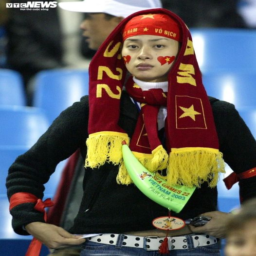

Generated: 
	 Bức ảnh chụp cận cảnh một người phụ nữ mặc áo khoác đen, đeo khăn quàng cổ màu đỏ có in hình ngôi sao vàng và dòng chữ "VIỆT NAM" và "VÔ BỊCH". Cô ấy đang cầm một tấm bảng màu xanh lá cây với dòng chữ "SEA GAMES VIETNAM 2003 FAIR PLAY". Trên đầu cô ấy là một chiếc khăn quàng cổ màu đỏ có in hình ngôi sao vàng và dòng chữ "VIỆT NAM" và "VÔ BỊCH".
Original: 
	 Phải dùng đến sức mạnh siêu nhiên thôi!

Label: 0

 19


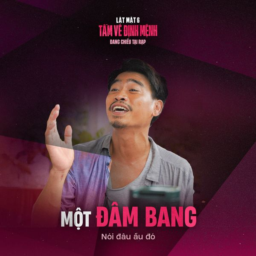

Generated: 
	 Bức ảnh có bố cục đơn giản, tập trung vào hình ảnh một người đàn ông trẻ tuổi đang cười rạng rỡ. Người đàn ông mặc áo sơ mi màu tím nhạt, đeo kính và đang giơ hai tay lên cao. Nền của bức ảnh là màu hồng đậm, tạo cảm giác ấm áp và vui tươi. Phía trên đầu người đàn ông là dòng chữ "LẤT MẮT 6 TÂM VỀ ĐỊNH MỆNH" được viết bằng font chữ in đậm, màu trắng. Dưới dòng chữ này là dòng chữ "ĐANG CHIẾN TẠI HẬP" cũng được viết bằng font chữ in đậm, màu trắng. Phía dưới cùng của bức ảnh là dòng chữ "MỘT ĐÂM BANG" được viết bằng font chữ in đậm, màu trắng. Dưới dòng chữ này là dòng chữ "Nói đâu âu đó" cũng được viết bằng font chữ in đậm, màu trắng.
Original: 
	 Các kiểu người trong 1 hội anh em =))
Lật Mặt 6 hiện đang công chiếu và có mặt tại các rạp trên toàn quốc.

Label: 0

 20


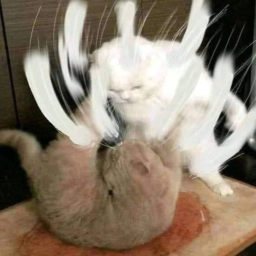

Generated: 
	 Hình ảnh cho thấy một con mèo trắng đang nằm trên một con mèo màu xám. Con mèo trắng có đôi mắt to tròn và đôi cánh rộng, trong khi con mèo xám có đôi mắt nhỏ hơn và đôi cánh nhỏ hơn. Cả hai con mèo đều đang nhìn về phía máy ảnh.
Original: 
	 #VOZ_F33 - Công ty của ông Nguyễn Tử Quảng trúng nhiều gói thầu có những tiêu chí đặc biệt
https://voz.vn/.../cong-ty-cua-ong-nguyen-tu-quang-trung.../

Label: 0

 21


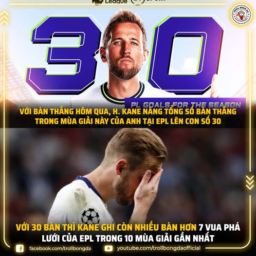

Generated: 
	 Bức ảnh là một poster quảng cáo cho trận đấu bóng đá. Bố cục được chia thành 3 phần chính:
- Phần trên cùng là tiêu đề "30" với số 30 được tô màu xanh dương nổi bật.
- Phần giữa là nội dung thông tin về trận đấu, bao gồm:
    - Tiêu đề: "PLIGA 9 FOR THE SEASON"
    - Nội dung: "VỚI BẢN THẮNG HÔD QUA, H KANE NÂNG TỔNG SỐ BẢN THẮNG TRONG MÙA GIẢI CỦA ANH TẠI EPL LÊN CON SỐ 30"
- Phần dưới cùng là thông tin về kết quả trận đấu, bao gồm:
    - Tiêu đề: "VỚI 30 BÀN THÔNG HIỆU QUẢ LƯƠNG CỦA EPL TRONG 10 MÙA GIẢI GẦN NHẤT"
    - Thông tin liên lạc: "facebook.com/trollbongdaigaoli", "youtube.com/crollbongdaigaoli"
Original: 
	 Thôi âu cũng là cái số 😕

Label: 1

 22


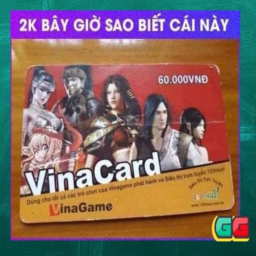

Generated: 
	 Bức ảnh là hình ảnh một thẻ VinaCard với nền màu vàng nâu. Phía trên cùng của thẻ có dòng chữ "2K BÂY GIỜ SAO BIẾT CÁI NÀY" được viết bằng màu xanh dương đậm. Ở góc trên bên phải có dòng chữ "60.000VNĐ" được viết bằng màu trắng. Phía dưới dòng chữ "2K BÂY GIỜ SAO BIẾT CÁI NÀY" là hình ảnh minh họa các nhân vật trong trò chơi VinaGame. Bên dưới hình ảnh là dòng chữ "Dùng cho tất cả các trò chơi của VinaGame phát hành và Siêu thị trực tuyến 123mua!" được viết bằng màu đen. Phía dưới cùng của thẻ có dòng chữ "VinaGame" được viết bằng màu đen. Góc dưới bên phải của thẻ có dòng chữ "www.123mua.com.vn" được viết bằng màu đen.
Original: 
	 Sao mà biết được

Label: 1

 23


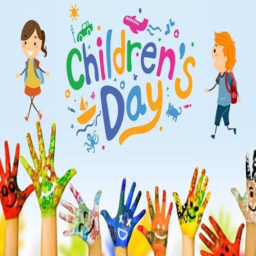

Generated: 
	 Bức ảnh có bố cục đơn giản với nền màu xanh nhạt. Ở trung tâm là dòng chữ "Children's Day" được viết theo kiểu chữ in hoa, màu sắc rực rỡ, tạo cảm giác vui tươi, rộn ràng. Phía trên dòng chữ là hình ảnh minh họa các hoạt động vui chơi giải trí cho trẻ em như xe hơi, máy bay, tàu hỏa, con mèo, và các trò chơi khác. Phía dưới dòng chữ là hình ảnh những bàn tay được tô màu nhiều sắc sặc sỡ, thể hiện sự vui vẻ và sáng tạo của trẻ em. Bức ảnh sử dụng phong cách hoạt hình dễ thương, thu hút sự chú ý của người xem.
Original: 
	 Chào tháng 6 với ngày Quốc tế Thiếu nhi.
Khi ta càng ngày càng già đi, những ký ức về tuổi thơ luôn in dấu mãi. Hãy trân trọng những khoảnh khắc trong hiện tại.
Chúc tất cả các thanh niên nhí ngày Quốc tế Thiếu nhi hạnh phúc!

Label: 0

 24


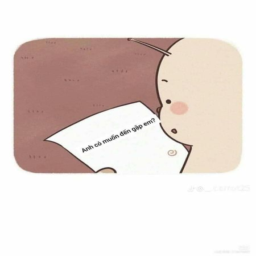

Generated: 
	 Bức ảnh là một hình minh họa đơn giản với nền màu nâu nhạt. Ở trung tâm là một nhân vật hoạt hình đang ngồi, tay cầm một tờ giấy trắng có dòng chữ "Anh có muốn đến gặp em?" được viết bằng chữ in hoa màu đen. Phía trên đầu nhân vật là một chiếc kính lúp màu nâu sẫm. Hình ảnh được vẽ theo phong cách hoạt hình vui nhộn và dễ thương.
Original: 
	 Đến ốc sên còn có đôi có cặp 🐌👍🏼 
-Kiến Ngủ-
Lạc mất nguồn gòi, ai biết nguồn cmt để bổ sung cre ạ.

Label: 0

 25


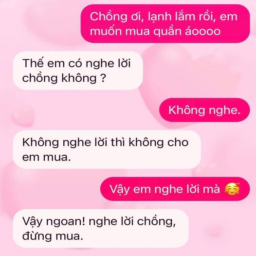

Generated: 
	 Bức ảnh là một đoạn hội thoại được viết bằng tiếng Việt trên nền hồng. Bố cục của bức ảnh bao gồm 4 phần: 
- Phần đầu tiên là một hình chữ nhật màu hồng với nội dung: "Chồng ơi, lạnh lắm rồi, em muốn mua quần áoooooo"
- Phần thứ hai là một hình chữ nhật màu hồng với nội dung: "Thế em có nghe lời chồng không?"
- Phần thứ ba là một hình chữ nhật màu hồng với nội dung: "Không nghe."
- Phần thứ tư là một hình chữ nhật màu hồng với nội dung: "Không nghe lời thì không cho em mua."
- Phần cuối cùng là một hình chữ nhật màu hồng với nội dung: "Vậy em nghe lời chồng, đừng mua."
Original: 
	 Ok

Label: 1

 26


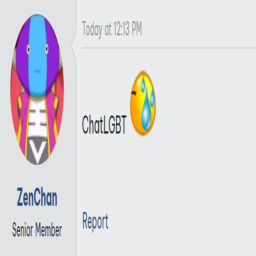

Generated: 
	 Bức ảnh hiển thị giao diện của một ứng dụng mạng xã hội. Bên trái là hình ảnh một nhân vật hoạt hình màu xanh dương với biểu cảm vui vẻ, bên dưới là dòng chữ "ZenChan" và "Senior Member". Bên phải là thanh công cụ với dòng chữ "Today at 12:13 PM" ở trên cùng. Dưới thanh công cụ là hai biểu tượng: biểu tượng màu vàng với dòng chữ "ChatLGBT" và biểu tượng màu xanh dương với dòng chữ "Report".
Original: 
	 #VOZ_F33 - Cha đẻ ChatGPT bí mật kết hôn với bạn trai
https://voz.vn/.../cha-de-chatgpt-bi-mat-ket-hon-voi-ban.../

Label: 2

 27


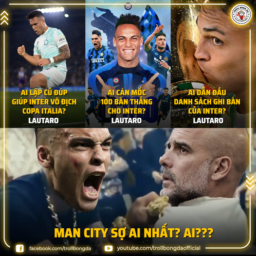

Generated: 
	 Bức ảnh được chia thành 4 phần, mỗi phần là một hình ảnh riêng biệt. Phần trên cùng bên trái là hình ảnh một cầu thủ bóng đá đang chơi bóng với dòng chữ "Ai lập cúp giúp Inter vô địch Copa Italia? LAUTARO". Phần trên cùng bên phải là hình ảnh một cầu thủ bóng đá đang chơi bóng với dòng chữ "Ai cần mốc 100 bàn thắng cho Inter? LAUTARO". Phần dưới cùng bên trái là hình ảnh một người đàn ông đang bị gạch chân bởi một người đàn ông khác với dòng chữ "MAN CITY SỢ AI NHẤT? AI???". Phần dưới cùng bên phải là hình ảnh một người đàn ông đang bị gạch chân bởi một người đàn ông khác với dòng chữ "MAN CITY SỢ AI NHẤT? AI???".
Original: 
	 Đẳng cấp nhà vô địch World Cup :3

Label: 0

 28


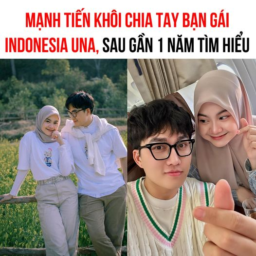

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau. Phần bên trái là hình ảnh một cặp đôi nam nữ đang đứng cạnh nhau, mặc áo trắng và quần đen. Cả hai đều đeo khăn quàng cổ màu trắng. Phía sau họ là một khung cảnh thiên nhiên với cây cối xanh mướt. Phần bên phải của bức ảnh là hình ảnh một người đàn ông trẻ tuổi đang cầm điện thoại selfie, nhìn về phía máy ảnh. Người đàn ông này có mái tóc đen ngắn, đeo kính và mặc áo khoác màu trắng. Bên cạnh anh ta là một người phụ nữ lớn tuổi hơn, mặc áo dài màu nâu nhạt, đội khăn huy hiệu màu vàng. Cả hai đều đang nhìn về phía máy ảnh. Trên cùng của bức ảnh là dòng chữ "MẠNH TIẾN KHÔI CHIA TAY BẠN GÁL INDONESIA UNA, SAU GẦN 1 NĂM TÌM HIỂU".
Original: 
	 Hiện tại Una đã xoá hết ảnh và clip quay chung cùng Mạnh Tiến Khôi trên trang cá nhân của mình

Label: 0

 29


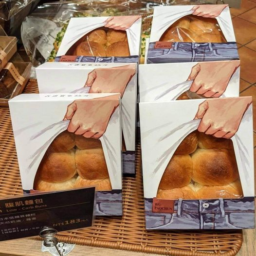

Generated: 
	 Bức ảnh chụp cận cảnh 4 hộp bánh mì được xếp chồng lên nhau trên một chiếc đĩa. Mỗi hộp bánh đều có thiết kế tương tự nhau, bao gồm hình ảnh một bàn tay đang cầm một miếng bánh mì và dòng chữ "Bánh Mì" in đậm ở góc trên bên phải. Phía dưới cùng của mỗi hộp bánh là dòng chữ "Món ăn ngon nhất" và giá tiền "18.000đ".
Original: 
	 Aiiii bánh mì nóng giòn đây

Label: 0

 30


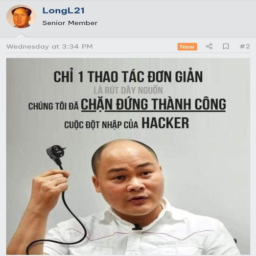

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội, có tiêu đề "CHỈ 1 THAO TÁC ĐƠN GIẢN LÀ RÚT DÂY NGUỒN CHẬN ĐỨNG THÀNH CÔNG CUỘC ĐỘT NHẬP CỦA HACKER". Bức ảnh có hình ảnh một người đàn ông mặc áo sơ mi trắng, tay cầm một thiết bị điện tử màu đen. Người đàn ông đang nhìn về phía máy ảnh và có vẻ như đang nói chuyện với người xem.
Original: 
	 #VOZ_F33 - Hàng trăm trang web cơ quan nhà nước bị tấn công kiểu mới
Link ở comment

Label: 1

 31


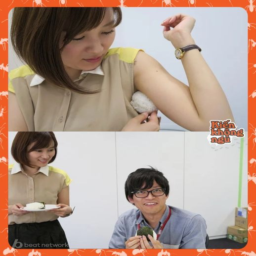

Generated: 
	 Bức ảnh được chia thành 3 phần. Phần trên cùng là hình ảnh một người phụ nữ trẻ đang cầm một viên kim cương, có vẻ như cô ấy đang chuẩn bị tham gia một hoạt động nào đó. Phần giữa là hình ảnh một người phụ nữ khác đang cầm một đĩa rau củ, có vẻ như cô ấy đang chuẩn bị cho một bữa ăn. Phần dưới cùng là hình ảnh một người đàn ông đang cầm một bát rau xanh, có vẻ như anh ấy đang chuẩn bị cho một bữa ăn. Bên cạnh mỗi hình ảnh đều có dòng chữ "Kiến không ngủ" và logo "beat network".
Original: 
	 CƠM NẮM NẶN BẰNG NÁCH ĐƯỢC BÁN VỚI GIÁ x10 LẦN CƠM NẮM BÌNH THƯỜNG... 
Những cô gái trẻ dùng nách để nặn cơm nắm. Nhưng trước đó, tất cả nguyên liệu và nách sẽ được khử trùng, làm sạch để đảm bảo vệ sinh an toàn thực phẩm 🥲
Sau đó, các cô gái sẽ vận động để tiết ra mồ hôi và dùng nách thay vì lòng bàn tay để nhào và tạo hình những viên cơm... và khách hàng sẽ phải xì ra số tiền gấp 10 lần cơm nắm thông thường để được ăn chúng 😳 
- Kiến Lang Thang -

Label: 1

 32


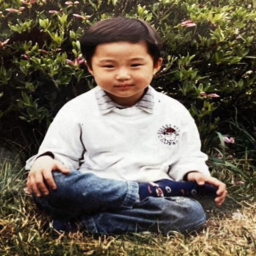

Generated: 
	 Hình ảnh cho thấy một cậu bé đang ngồi trên thảm cỏ. Cậu bé mặc áo khoác trắng, quần jean xanh và có mái tóc đen ngắn. Anh ta đang nhìn thẳng vào ống kính máy ảnh với vẻ mặt vui vẻ. Phía sau cậu bé là một hàng cây xanh tươi tốt.
Original: 
	 Ảnh thơ ấu kháu khỉnh của Byun Woo Seok (Lovely Runner) 🥰

Label: 0

 33


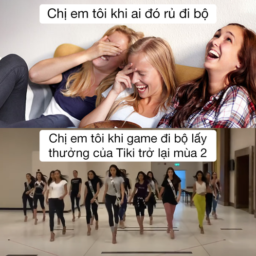

Generated: 
	 Bức ảnh được chia thành hai phần. Phần trên là hình ảnh một nhóm bốn người phụ nữ đang cười vui vẻ, với dòng chữ "Chị em tôi khi ai đó rủ đi bộ" ở phía trên. Phần dưới là hình ảnh một nhóm trẻ em đang chơi trò chơi Tiki, với dòng chữ "Chị em tôi khi game đi bộ lấy thưởng của Tiki trở lại mùa 2" ở phía trên.
Original: 
	 Đi bộ cày 300k, ngang 1 ngày chấm công đầy đủ rồi

Label: 0

 34


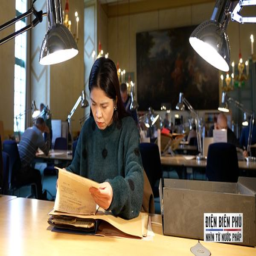

Generated: 
	 Bức ảnh chụp một văn phòng làm việc với nhiều người đang làm việc. Ở trung tâm bức ảnh là một người phụ nữ đang đọc báo, cô ấy mặc áo len màu xanh lá cây và đang cầm tờ báo trong tay. Phía trước cô ấy là một chiếc bàn làm việc bằng gỗ, trên bàn có một số tài liệu được xếp gọn gàng. Trên bàn còn có một hộp giấy màu xám với dòng chữ "ĐIỆN BIÊN PHỦ NHÌN TỪ NƯỚC PHÁP". Bức ảnh được chụp từ góc nghiêng, cho phép người xem nhìn thấy toàn bộ không gian của văn phòng làm việc.
Original: 
	 VTV ĐẶC BIỆT: ĐIỆN BIÊN PHỦ - NHÌN TỪ NƯỚC PHÁP
Khai thác kho tư liệu đồ sộ về Chiến dịch Điện Biên Phủ  
Chỉ có 4 tháng để nghiên cứu và thực hiện ghi hình tại Việt Nam và Pháp, VTV đặc biệt Điện Biên Phủ - Nhìn từ nước Pháp là hành trình gấp rút của nhóm sản xuất Ban Truyền hình đối ngoại, Đài truyền hình Việt Nam. Ê-kíp đã khai thác khối tư liệu đồ sộ về chiến dịch Điện Biên Phủ tại Trung tâm Lưu trữ của Bộ Quốc phòng Pháp, Quốc hội Pháp để tiếp cận nhiều tài liệu mới được giải

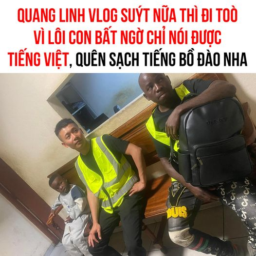

Generated: 
	 Bức ảnh chụp 3 người đàn ông trong một căn phòng. Người đàn ông ở giữa mặc áo vest màu vàng và quần đen, tay cầm một chiếc túi xách màu đen có in chữ "JEFFERSON". Người đàn ông bên trái mặc áo vest màu vàng và quần đen, tay đặt lên ngực. Người đàn ông bên phải mặc áo vest màu vàng và quần đen, tay cầm một chiếc túi xách màu đen có in chữ "DUS". Phía trên cùng của bức ảnh là dòng chữ "QUANG LINH VLOG SUYT NƯỚI THÌ ĐI TOÒ VÌ LÔI CON BẤT NGỜ CHỈ NÓI ĐƯỢC TIẾNG VIỆT, QUÊN SẠCH TIẾNG BỒ ĐÀO NHA".
Original: 
	 Theo chia sẻ của 1 bạn trong team, Quang Linh suýt bị “tóm” tại sân bay Angola vì khi cảnh sát sân bay giữ ông cháu Lôi Con lại hỏi thì ông cháu bất ngờ quên sạch tiếng Bồ Đào Nha và chỉ nói chuyện bằng tiếng Việt.
Điều này khiến cảnh sát nghi ngờ nên đã không cho team xuất cảnh. Các chú phải giải thích vã mồ hôi mới có thể qua được vòng kiểm soát an ninh 🥹

Label: 0

 36


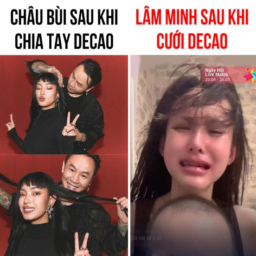

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau. Phần bên trái có tiêu đề "CHÂU BÙI SAU KHI CHIA TAY DECAO" và phần bên phải có tiêu đề "LÂM MINH SAU KHI CƯỚI DECAO".  Phần bên trái có hình ảnh một cặp đôi đang chia tay với dòng chữ "CHÂU BÙI SAU KHI CHIA TAY DECAO" ở góc trên bên trái.  Phần bên phải có hình ảnh một người phụ nữ đang cười rạng rỡ với dòng chữ "LÂM MINH SAU KHI CƯỚI DECAO" ở góc trên bên phải.
Original: 
	 Là phụ nữ chọn đúng người chồng quan trọng lắm

Label: 0

 37


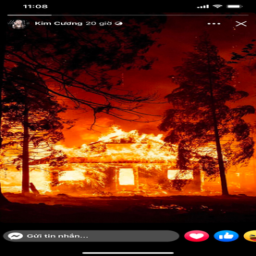

Generated: 
	 Bức ảnh chụp màn hình điện thoại hiển thị một bài đăng trên mạng xã hội. Bài đăng có tiêu đề "Kim Cường 20 giờ" ở góc trên cùng bên trái. Bên dưới tiêu đề là hình ảnh một ngôi nhà bị cháy với ánh sáng màu vàng rực rỡ, được bao quanh bởi những tán cây tối. Phía dưới hình ảnh là nút "Gửi tin nhắn..." và các biểu tượng liên quan đến việc gửi tin nhắn.
Original: 
	 Nghi vấn Liz Kim Cương và Trịnh Thăng Bình mâu thuẫn: Unfollow nhau trên mxh, MV sắp ra mắt bị huỷ ngay trước ngày phát hành?
Chiều 13/5, B Production (công ty của Trịnh Thăng Bình) bất ngờ thông báo huỷ bỏ việc ra mắt MV "Chúng Ta Không Thể Quay Lại" của Trịnh Thăng Bình và Liz Kim Cương.
Netizen cũng phát hiện 2 người đã unfollow nhau trên Instagram, lộ rõ nghi vấn "cạch mặt". Trước đó, cả 2 đã có nhiều status và story ẩn ý về sự mâu thuẫn nhưng chưa chính thức xác nhận vấn đề trên.

Label: 0

 38


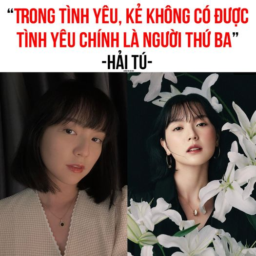

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau. Phần bên trái là hình ảnh một người phụ nữ trẻ với mái tóc đen dài, mặc áo khoác màu trắng và nhìn thẳng vào ống kính. Phần bên phải là hình ảnh một người phụ nữ khác với mái tóc đen dài, mặc áo sơ mi đen và nhìn về phía bên phải. Cả hai hình ảnh đều được đặt trên nền trắng. Dưới cùng của bức ảnh là dòng chữ "TRONG TÌNH YÊU, KẺ KHÔNG CÓ ĐƯỢC TÌNH YÊU CHÍNH LÀ NGƯỜI THỨ BA" - HẢI TÚ-
Original: 
	 Châm ngôn của những người thích xen vào mối quan hệ của người khác

Label: 1

 39


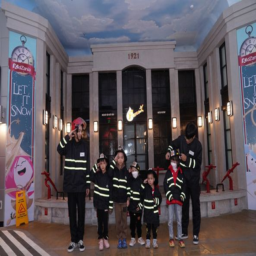

Generated: 
	 Bức ảnh chụp một nhóm trẻ em đang đứng trước một tòa nhà. Tòa nhà có kiến trúc cổ điển với nhiều cửa sổ và mái vòm. Trên nóc tòa nhà có dòng chữ "1921" được in nổi bật. Phía trước tòa nhà là một tấm biển quảng cáo với dòng chữ "KidZania" và hình ảnh một con chim màu vàng. Bên cạnh đó là một tấm biển quảng cáo khác với dòng chữ "Let It Snow" và hình ảnh một ngôi sao năm cánh. Các trẻ em trong bức ảnh đều mặc áo khoác đen viền vàng, đội mũ lưỡi trai và đeo khẩu trang y tế. Họ đang tạo dáng chào đón khán giả.
Original: 
	 Chuyên mục không làm người đọc thất vọng
Theo danh sách của ông già noel, quà giáng sinh dành tặng cho các trẻ ngoan, vậy thì các bạn nhỏ của bệnh viện nhi trung ương chắc chắn là những em bé đứng đầu danh sách rồi. Vì thế mà mùa lễ hội này KidZania đã dành tặng cho các bạn nhỏ một buổi trải nghiệm tập làm người lớn thật vui vẻ, và sự ngọt ngào từ những chiếc bánh cupcake sắc màu, những món quà và tấm thiệp từ bạn bè.

Label: 0

 40


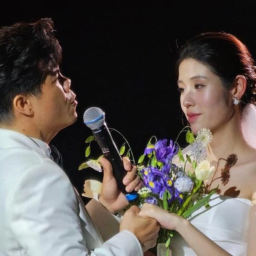

Generated: 
	 Bức ảnh chụp cận cảnh hai người, một nam và một nữ, đang đứng trên sân khấu. Nam thanh niên mặc vest trắng, tay cầm micro, đang nói chuyện với nữ thanh niên mặc váy cưới. Nữ thanh niên mặc váy cưới màu trắng, tóc buộc gọn gàng, đang nhìn về phía trước. Cả hai đều có vẻ rất vui vẻ và hạnh phúc.
Original: 
	 Hôn lễ của Đinh Mạnh Ninh và bà xã Thảo Trang sau hơn 10 năm yêu nhau. Lễ cưới có sự tham dự của MC Phí Linh, Dương Hoàng Yến, Vũ Hạnh Nguyên... 
Không gian tiệc trang trí như vườn cổ tích, cô dâu chú rể không kiềm được nước mắt khi trao nhau lời nguyện thề.

Label: 0

 41


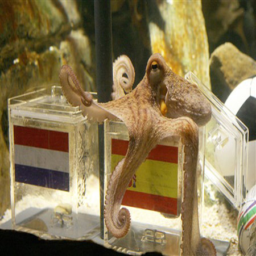

Generated: 
	 Bức ảnh chụp cận cảnh một con bạch tuộc đang được đặt trong một bể kính. Con bạch tuộc có màu nâu sẫm, uốn lượn theo hình dạng của một con bạch tuộc thông thường. Nó đang nằm nghiêng về phía bên phải của bức ảnh, với phần đầu hướng về phía máy ảnh. Phía sau con bạch tuộc là một chiếc bóng đá và một tấm biển ghi dòng chữ "VIỆT NAM".
Original: 
	 BẠCH TUỘC PAUL CHỌN TÂY BAN NHA LÀ NHÀ VÔ ĐỊCH WORLD CUP !!!!
Nổi danh từ Euro 2008, chú bạch tuộc Paul đã trở nên vô cùng nổi tiếng khi đưa ra những lời tiên tri vô cùng chính xác, điển hình là chọn Tây Ban Nha dành chiến thắng trước Đức và mới đây, chú bạch tuộc này đã tiếp tục về phe Xứ Đấu Bò thay vì Hà Lan cho chức vô địch World Cup diễn ra tại Nam Phi.
Xin chúc mừng đội tuyển Tây Ban Nha, được Paul chọn thì coi như đặt 1 tay vào cup cmnr !!!!!!! Nên nhớ, ở bộ môn tiếng Anh, TBN là SPAIN và trong đó S là Superrrrr !!!!!!!!

Label: 1

 42


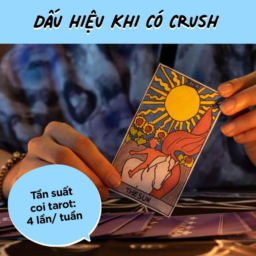

Generated: 
	 Bức ảnh chụp cận cảnh bàn tay của một người đang cầm một tấm thiệp trang trí màu đỏ với hình ảnh mặt trời vàng rực rỡ ở phía trên. Tấm thiệp có dòng chữ "THE SUN" được in đậm ở góc dưới bên phải. Phía trên tấm thiệp là dòng chữ "DẤU HIỆU KHI CÓ CRUSH" được viết bằng font chữ in đậm, cỡ chữ lớn và màu đen. Bên cạnh tấm thiệp là một bong bóng thoại màu xanh dương với dòng chữ "Tần suất coi tarot: 4 lần/tuần" được viết bằng font chữ in đậm, cỡ chữ nhỏ hơn.
Original: 
	 Đếm xem bạn có bao nhiêu dấu hiệu trong đây nhá 😀
Đã làm đủ các cách, kể cả tặng kem Cornetto mà vẫn ế thì là do bạn xui thui bạn ơi :)))
#Cornetto #Back2School #Thínhngon #Tạonétvàolòngcrush

Label: 3

 43


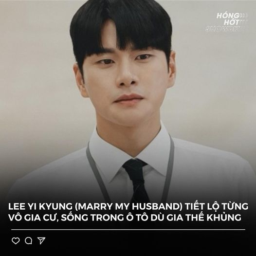

Generated: 
	 Bức ảnh có bố cục đơn giản, tập trung vào hình ảnh một người đàn ông trẻ tuổi với mái tóc đen ngắn, mặc áo sơ mi trắng và cà vạt đen. Anh ta đang nhìn thẳng vào ống kính máy ảnh với vẻ mặt nghiêm nghị. Phía trên đầu anh ta là dòng chữ "HỒNG HOT" được viết bằng font chữ in hoa màu xanh đậm. Bên dưới hình ảnh là dòng chữ "LEE YI KYUNG (MARRY MY HUSBAND) TIẾT LỖ TỪNG VÔ GIA CƯ, SỐNG TRONG Ô TÔ DU GIA THẾ KHỦNG" được viết bằng font chữ in thường màu trắng.
Original: 
	 Tại fanmeeting của Choi Daniel, Lee Yi Kyung tiết lộ mình xem nam tài tử này như anh trai: “Khi anh trai tôi gọi điện mời đến đây, tôi phải làm những gì có thể. Anh ấy là một trong số ít những người quý giá trong cuộc đời tôi. 
Khi tôi vô gia cư và sống trong ô tô, anh Choi Daniel đã rời khỏi ngôi nhà anh ấy sống và đưa nó cho tôi. Anh ấy cho tôi tiền thuê nhà hàng tháng”. 
Lee Yi Kyung không nhận tiền mặt vì không muốn mối quan hệ của mình gắn liền với tiền bạc, "Anh trai của Choi Daniel sống ở tầng trên và an

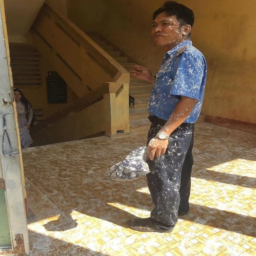

Generated: 
	 Bức ảnh chụp một người đàn ông mặc áo sơ mi xanh dương, quần đen đang đứng trên cầu thang. Anh ta đang cầm một chiếc túi màu đen trong tay. Phía sau anh ta là một bức tường màu vàng nhạt. Trên tường có một tấm biển quảng cáo bằng tiếng Việt. Bức ảnh được chụp từ góc nghiêng, cho phép người xem nhìn thấy toàn bộ khuôn mặt của người đàn ông.
Original: 
	 " Tao đâu có ra trường đâu mà tụi bây cũng không tha " - Anh bảo vệ bồi hồi kể lại

Label: 1

 45


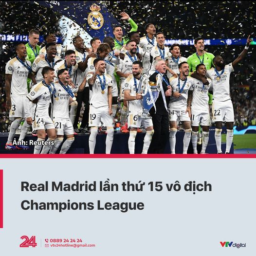

Generated: 
	 Bức ảnh chụp một nhóm cầu thủ bóng đá đang vui mừng sau khi giành chiến thắng. Họ mặc áo đấu màu trắng với dòng chữ "Real Madrid" được in rõ ràng trên ngực áo. Có thể thấy họ đang đứng trên một bục cao, xung quanh là những người hâm mộ và khán giả. Phía dưới cùng của bức ảnh là thông tin về trận đấu: "Real Madrid lần thứ 15 vô địch Champions League". Bên cạnh đó là thông tin liên lạc của VTV Digital.
Original: 
	 Rạng sáng 2/6, Real Madrid đã trở thành nhà vô địch Champions League mùa giải 2023-2024 sau chiến thắng 2-0 trước Dortmund ở trận chung kết tại sân Wembley (London, Anh).
Kịch bản của trận chung kết Champions League 2023-2024 đã diễn ra theo một cách quá nghiệt ngã cho Dortmund. Họ chơi hay hơn trong hơn 70 phút khi tạo ra nhiều cơ hội ghi bàn nhưng cuối cùng lại nhận thất bại. Bên cạnh khâu dứt điểm không tốt, Dortmund còn bị khuất phục bởi sự xuất sắc của Courtois.
Không ghi được bàn thắng, Dortmund đã phải nhận hai bàn thua ở 20 phút cuối của trận đấu.
Với chứ

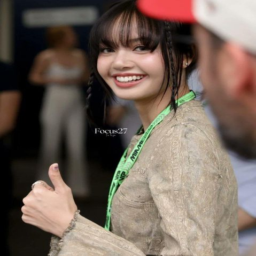

Generated: 
	 Bức ảnh chụp cận cảnh một cô gái trẻ với mái tóc đen được chia đôi, đang cười tươi và giơ ngón cái lên. Cô ấy mặc một chiếc áo dài màu nâu nhạt có họa tiết hoa văn. Trên ngực áo của cô ấy có một dây đeo màu xanh lá cây với dòng chữ "MIRIAM" được in nổi bật. Phía dưới cùng bên trái của bức ảnh có dòng chữ "Focus27" được in nhỏ.
Original: 
	 LISA (BLACKPINK) xuất hiện tại Giải đua Công thức 1 Miami 2024. Cô vẫy lá cờ 🏁 là cột mốc lớn đối với sức ảnh hưởng của LISA tại thị trường quốc tế.

Label: 0

 47


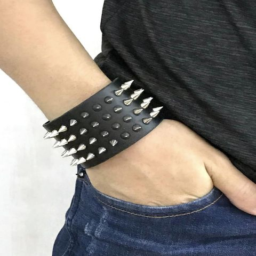

Generated: 
	 Hình ảnh cho thấy một người đàn ông đang đeo một chiếc vòng tay bằng kim loại màu đen. Vòng tay này được thiết kế với những đường viền nhọn, tạo cảm giác mạnh mẽ và độc đáo. Người đàn ông mặc một chiếc áo sơ mi màu đen và quần jean màu xanh dương. Bối cảnh của hình ảnh là một bức tường màu trắng.
Original: 
	 Gen 2 coded.

Label: 0

 48


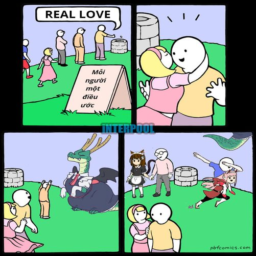

Generated: 
	 Bức ảnh được chia thành 4 khung hình nhỏ, mỗi khung hình mô tả một tình huống khác nhau. Khung hình đầu tiên có tiêu đề "REAL LOVE" và minh họa một người đàn ông đang bế một người phụ nữ với dòng chữ "Mỗi người một điều ước". Khung hình thứ hai mô tả một người đàn ông đang hôn một người phụ nữ với dòng chữ "Mỗi người một điều ước". Khung hình thứ ba mô tả một người đàn ông đang hôn một người phụ nữ với dòng chữ "Mỗi người một điều ước". Khung hình cuối cùng mô tả một người đàn ông đang hôn một người phụ nữ với dòng chữ "Mỗi người một điều ước".
Original: 
	 - Elsa
#interpool #WMO #WorldMemeOrganization

Label: 2

 49


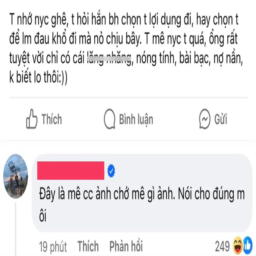

Generated: 
	 Bức ảnh hiển thị một đoạn văn bản tiếng Việt được viết bằng font chữ màu đen trên nền trắng. Văn bản được chia thành hai phần: phần đầu là một câu nói ngắn, phần sau là một đoạn văn bản dài hơn. Phần đầu có nội dung: "T nhớ nực ghê, t hỏi hắn bh chọn t lợi dụng đi, hay chọn t để lâm đau khổ đi mà nó chịu bã. T mê nực t quá, ống rất tuyệt với chỉ có cái lãng nhàng, nóng tính, bài bạc, nợ nần, k biết lo thôi:". Phần sau là một đoạn văn bản dài hơn: "Đây là mê cc ảnh chờ mê gì ảnh. Nói cho đúng m ôi".
Original: 
	 Trai xấu thì không tốt còn trai tốt thì không vui

Label: 1

 50


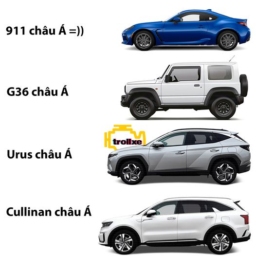

Generated: 
	 Bức ảnh hiển thị 4 chiếc xe ô tô khác nhau được sắp xếp theo chiều dọc từ trên xuống dưới. Mỗi chiếc xe được minh họa bằng hình ảnh riêng biệt, bao gồm màu sắc, kích thước và dòng chữ mô tả. Bên cạnh mỗi chiếc xe là một dòng chữ mô tả ngắn gọn về loại xe đó. Từ trên xuống dưới, các dòng chữ lần lượt là:

- 911 châu Á = )
- G36 châu Á
- Ursus châu Á
- Cullinan châu Á
Original: 
	 “Gọi vậy cho nó soang mồm!” – Sw*ft
#châuÁ

Label: 0

 51


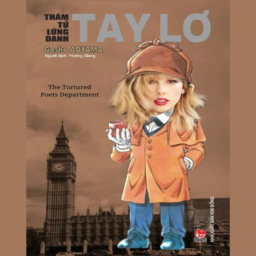

Generated: 
	 Bức ảnh là bìa sách với bố cục đơn giản, tập trung vào hình minh họa một cô gái trẻ mặc áo khoác màu cam, đội mũ lưỡi trai màu nâu. Cô gái đang cầm một quyển sách và nhìn về phía máy ảnh. Phía sau cô gái là hình ảnh tháp đồng hồ Big Ben ở London, Anh Quốc. Phía trên cùng của bìa sách là dòng chữ "THÁM TỬ LÙNG DANH", bên dưới là tên tác giả "Gosho Aoyama" và dòng chữ nhỏ hơn "Người dịch: Hương Giang". Dòng chữ lớn nhất trên bìa sách là "TAY LỖ", được viết theo kiểu chữ in hoa cách điệu. Ở góc dưới bên phải của bìa sách là logo của nhà xuất bản "KIM ĐỒNG" và dòng chữ "NHÀ XUẤT BẢN KIM ĐỒNG".
Original: 
	 tóm tắt The Tortured Poets Department:

Label: 1

 52


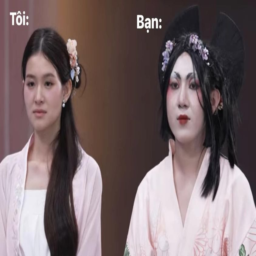

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau, mỗi phần là hình ảnh của một người phụ nữ. Bên trái là hình ảnh của một người phụ nữ với mái tóc đen dài, mặc áo trắng và đeo hoa trang trí. Bên phải là hình ảnh của một người phụ nữ với mái tóc đen ngắn, mặc áo trắng và đeo hoa trang trí. Ở góc trên bên trái của bức ảnh có dòng chữ "Tôi:" và ở góc trên bên phải của bức ảnh có dòng chữ "Bạn:". Dòng chữ "Tôi:" được đặt phía trên đầu người phụ nữ bên trái, trong khi dòng chữ "Bạn:" được đặt phía trên đầu người phụ nữ bên phải.
Original: 
	 👩🏻: Chiều đi bân xiển k, ăn mặc xuề xoà thôi nhé
👱‍♀️: Ô cê
Chiều:
Cre: Shoppertainer - Ngôi Sao Chốt Đơn

Label: 0

 53


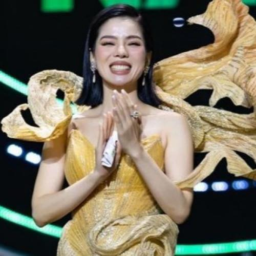

Generated: 
	 Hình ảnh cho thấy một người phụ nữ đang đứng trên sân khấu. Cô ấy mặc một chiếc váy màu vàng và đang cười rạng rỡ. Cô ấy đang vỗ tay và có vẻ như đang biểu diễn.
Original: 
	 Chúc mừng Lệ Quyên đoạt giải Chị Đẹp Phòng Trà 😍😍😍

Label: 1

 54


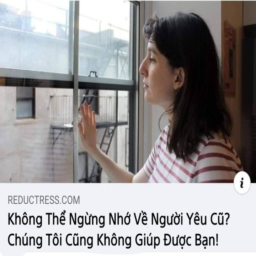

Generated: 
	 Bức ảnh chụp một người phụ nữ đang nhìn ra ngoài cửa sổ. Cô ấy có mái tóc dài màu nâu và đang mặc áo sơ mi kẻ sọc trắng đỏ. Người phụ nữ đang đưa tay ra khỏi cửa sổ để nhìn ra bên trong. Bức ảnh được chụp từ góc nghiêng, tạo cảm giác chân thực và gần gũi. Phía dưới bức ảnh là dòng chữ "REDUCTRESS.COM" và dòng chữ "Không Thể Ngừng Nhớ Về Người Yêu Cũ? Chúng Tôi Cũng Không Giúp Được Bạn!" được viết bằng font chữ đen đậm, cỡ chữ lớn, tạo điểm nhấn cho bức ảnh.
Original: 
	 Nói như nói 😊

Label: 1

 55


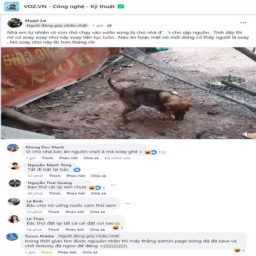

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội với tiêu đề "VOZ.VN - Công nghệ - Kỹ thuật" ở góc trên bên trái. Bài đăng có hình ảnh một con chó đang chạy vào vườn, được chụp từ góc nghiêng. Phía dưới hình ảnh là một đoạn văn bản tiếng Việt miêu tả về việc chó nhà bị chó nhà ăn nguồn vpin và xoay nghêv. Dưới cùng của bức ảnh là danh sách các người chia sẻ bài đăng, bao gồm: Huan Le, Khong Duc Manh, Nguyễn Mạnh Tùng, Nguyễn Thái Quang, Lê Bình, Lê Thảo, Tomm Riddle. Mỗi người chia sẻ kèm theo thời gian tương ứng (1 giờ, 52 phút, 49 phút, 23 phút, 28 phút, 1 giờ).
Original: 
	 😄

Label: 0

 56


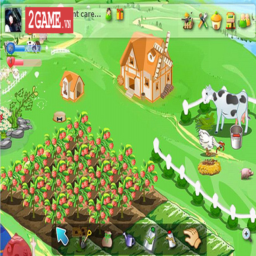

Generated: 
	 Bức ảnh là một mô hình minh họa cho một trò chơi trực tuyến với chủ đề nông nghiệp. Bối cảnh là một khu vườn với nhiều loại cây trồng khác nhau, bao gồm cây cà chua, cây dưa hấu, cây chuối và cây táo. Phía trên cùng bên trái của bức ảnh có dòng chữ "2GAME . VN", phía trên cùng bên phải có dòng chữ "nt care...". Ở giữa bức ảnh là một ngôi nhà nhỏ màu cam với mái ngói đỏ, xung quanh ngôi nhà là những hàng rào cỏ xanh mướt. Bên cạnh ngôi nhà là một con bò sữa trắng đang cầm một quả lúa. Phía trước ngôi nhà là một con gà trống đang cầm một cái thùng rác. Phía dưới cùng bên trái là một người đàn ông đang cầm một chiếc kẹp gỗ. Phía dưới cùng bên phải là một người đàn ông đang cầm một cái bình thủy tinh.
Original: 
	 "MẠNG XÃ HỘI ZING ME CHÍNH THỨC RA MẮT GIỚI TRẺ VIỆT NAM !!!"
Chắc hẳn nhiều người vẫn nhớ ngày này của 12 năm trước, ngày mà chúng ta lần đầu tiên có 1 mạng xã hội dành riêng cho giới trẻ Việt Nam.
Combo ra nét ngày đấy sẽ là bật máy lên nghe Mùa Đông Không Lạnh vớ

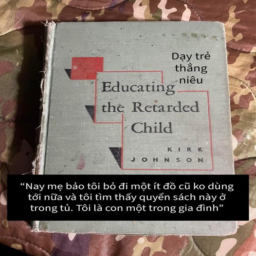

Generated: 
	 Bức ảnh chụp cận cảnh bìa một cuốn sách. Bìa sách có màu xám nhạt, với dòng chữ "Dạy trẻ thẳng niêu" được in màu đen ở góc trên bên phải. Dưới dòng chữ này là dòng chữ "Educating the Retarded Child" được in màu đen, cỡ chữ lớn hơn. Phía dưới dòng chữ này là tên tác giả "KIRK JOHNSON" được in màu đen, cỡ chữ nhỏ hơn. Phía dưới cùng của bìa sách là một đoạn trích dẫn: "Nay mẹ bảo tôi bỏ đi một ít đồ cũ ko dùng tới nữa và tôi tìm thấy quyển sách này ở trong tủ. Tôi là con một trong gia đình."
Original: 
	 Thật sự mất lòng =)))))

Label: 1

 58


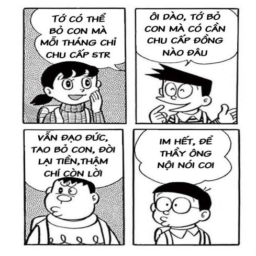

Generated: 
	 Bức ảnh là một trang truyện tranh với 4 khung hình. Khung hình đầu tiên ở góc trên bên trái có nội dung: "Tớ có thể bỏ con mà mỗi tháng chỉ chu cấp 5TR". Khung hình thứ hai ở góc trên bên phải có nội dung: "Ôi dào, tớ bỏ con mà có cần chu cấp đồng nào đâu". Khung hình thứ ba ở góc dưới bên trái có nội dung: "Vẫn đạo đức, tao bỏ con, đời lại tiền, thâm chí còn lời". Khung hình thứ tư ở góc dưới bên phải có nội dung: "Im hết, để thầy ông nội nói coi".
Original: 
	 Bảng xếp hạng đạo đức

Label: 1

 59


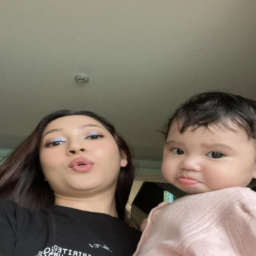

Generated: 
	 Bức ảnh chụp cận cảnh một người phụ nữ và một đứa trẻ. Người phụ nữ mặc áo đen có in chữ trắng, trong khi đứa trẻ mặc áo màu hồng nhạt. Cả hai đều đang nhìn vào ống kính máy ảnh. Bức ảnh được chụp từ góc nghiêng, tạo cảm giác chân thực và gần gũi.
Original: 
	 Lần đầu Bảo Anh khoe ảnh chụp cùng con gái Misumi ❤️

Label: 0

 60


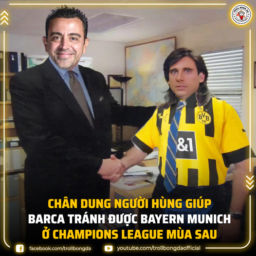

Generated: 
	 Bức ảnh có bố cục đơn giản, tập trung vào hai người đàn ông đang bắt tay nhau. Người đàn ông bên trái mặc vest đen, người đàn ông bên phải mặc áo phông màu vàng với dòng chữ &1 được in trên áo. Phía dưới hai người đàn ông là dòng chữ "CHÂN DUNG NGƯỜI HÙNG GIÚP BARCA TRÁNH ĐƯỢC BAYERN MUNICH Ở CHAMPIONS LEAGUE MÙA SAU" được viết bằng font chữ trắng, cỡ chữ lớn và in đậm. Phía dưới cùng của bức ảnh là hai biểu tượng mạng xã hội Facebook và Youtube với địa chỉ website: facebook.com/trollbongdaobaia và youtube.com/trollbongdaobaia.
Original: 
	 Mãi là anh em

Label: 0

 61


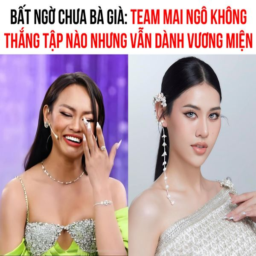

Generated: 
	 Bức ảnh được chia thành hai phần bằng nhau, mỗi phần là hình ảnh của một người phụ nữ. Bên trái là một người phụ nữ đang cười rạng rỡ, mặc một chiếc váy màu xanh lá cây có họa tiết trang trí lấp lánh. Người phụ nữ này có mái tóc đen dài và đeo một chiếc tai nghe nhỏ. Phía trên đầu cô ấy là dòng chữ "BẤT NGỜ CHƯA BÀ GIÀ: TEAM MAI NGÔ KHÔNG THẮNG TẬP NÀO NHƯNG VĂN DÀNH VƯƠNG MIÊN". Bên phải là một người phụ nữ khác, cũng đang cười rạng rỡ, mặc một chiếc váy màu bạc có họa tiết trang trí lấp lánh. Người phụ nữ này có mái tóc đen dài và đeo một chiếc tai nghe nhỏ. Phía trên đầu cô ấy là dòng chữ "BẤT NGỜ CHƯA BÀ GIÀ: TEAM MAI NGÔ KHÔNG THẮNG TẬP NÀO NHƯNG VĂN DÀNH VƯƠNG MIÊN".
Original: 
	 Mai Ngô said: Đấu đá chi cho mệt vậy mấy mẹ

Label: 1

 62


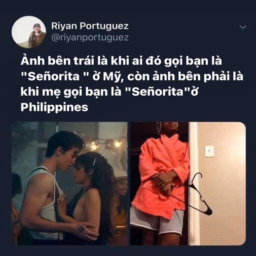

Generated: 
	 Bức ảnh là một bài đăng trên mạng xã hội với tiêu đề "Ryan Portugalz @ryanportuguez". Nội dung bài đăng là: "Ảnh bên trái là khi ai đó gọi bạn là "Seforita" ở Mỹ, còn ảnh bên phải là khi mẹ gọi bạn là "Seforita" ở Philippines". Bức ảnh được chia thành 3 phần: 
- Phần đầu tiên là hình ảnh hai người đang hôn nhau. 
- Phần thứ hai là hình ảnh một người phụ nữ mặc áo khoác màu hồng đang đứng trong phòng. 
- Phần thứ ba là hình ảnh một người phụ nữ mặc áo khoác màu trắng đang đứng trong phòng.
Original: 
	 Một từ, hai số phận 🥰

Label: 1

 63


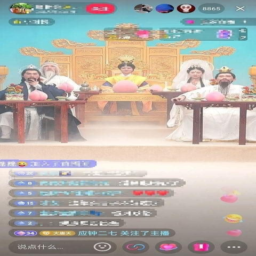

Generated: 
	 Bức ảnh chụp màn hình của một cuộc trò chuyện trực tuyến.  Phần trên cùng của màn hình hiển thị các biểu tượng mạng xã hội như Facebook, Twitter, Instagram, TikTok, Google Plus, và một số biểu tượng khác. Phía dưới là phần nội dung chính của cuộc trò chuyện, bao gồm: 

- **Tiêu đề:** "Dòng chữ bị che khuất" 
- **Nội dung:** Một đoạn văn bản tiếng Trung với nội dung liên quan đến chủ đề "Dòng chữ bị che khuất". 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:** "Dòng chữ bị che khuất" 
- **Phần kết thúc:*

In [ ]:
val_label_counts = {
    0: 0, 1: 0, 2: 0, 3:0,
}

for batch in val_loader:
    images              = batch['image']
    generated_captions  = batch['generated_caption']
    captions            = batch['caption']
    labels              = batch['label']

    for i in range(len(images)):
        print('\n', i)
        display(transforms.ToPILImage()(images[i]))

        print('Generated: \n\t', generated_captions[i])
        print('Original: \n\t', captions[i])

        val_label_counts[labels[i].item()] += 1
        print('\nLabel:', labels[i].item())

    break

In [ ]:
for key, value in val_label_counts.items():
    print(key, '\n', value)

0 
 40
1 
 21
2 
 2
3 
 1


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


image encoder (batch_size, num_tokens=197, emb_dim)

image encoder (batch_size, num_tokens=257, emb_dim)

In [ ]:
class TextEncoder(nn.Module):
    def __init__(self):
        super(TextEncoder, self).__init__()
        self.max_len = 197                  # max number of tokens - phụ thuộc num_tokens của image encoder
        self.tokenizer = AutoTokenizer.from_pretrained('uitnlp/CafeBERT')
        self.text_transformer = AutoModel.from_pretrained('uitnlp/CafeBERT')

    def forward(self, texts):
        texts = texts.tolist() if isinstance(texts, np.ndarray) else texts
        max_length = self.max_len

        inputs = self.tokenizer(texts, padding='max_length', truncation=True, max_length=max_length, return_tensors='pt').to(device)
        outputs = self.text_transformer(**inputs)
        return outputs.last_hidden_state    # (B, N, D)

In [ ]:
def clones(module, N):
    "Produce N identical layers."
    return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])

In [ ]:
class LayerNorm(nn.Module):
    def __init__(self, features, eps=1e-6):
        super(LayerNorm, self).__init__()
        self.a_2 = nn.Parameter(torch.ones(features))
        self.b_2 = nn.Parameter(torch.zeros(features))
        self.eps = eps

    def forward(self, x):
        mean = x.mean(-1, keepdim=True)
        std = x.std(-1, keepdim=True)
        return self.a_2 * (x - mean) / (std + self.eps) + self.b_2

In [ ]:
class SublayerConnection(nn.Module):
    """
    A residual connection followed by a layer norm.
    Note for code simplicity the norm is first as opposed to last.
    """

    def __init__(self, d_model, dropout):
        super(SublayerConnection, self).__init__()
        self.norm = LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, sublayer):
        "Apply residual connection to any sublayer with the same size."
        return x + self.dropout(sublayer(self.norm(x)))

In [ ]:
class MultiHeadedAttention(nn.Module):
    def __init__(self, d_model, dropout=0.1):
        super(MultiHeadedAttention, self).__init__()

        self.d_model = d_model
        self.dropout = nn.Dropout(p=dropout)

        self.f_h = nn.Linear(d_model, d_model)
        self.w_h = nn.Parameter(torch.randn(d_model))
        self.f_o = nn.Linear(d_model, d_model)


    def forward(self, phi):

        h = self.f_h(phi)                                           # (B, N, D)
        scores = torch.matmul(h, self.w_h) / np.sqrt(self.d_model)  # (B, N)

        alphas = torch.softmax(scores, dim=-1)      # (B, N)
        alphas = alphas.unsqueeze(-1)               # (B, N, 1)

        if self.dropout is not None:
            alphas = self.dropout(alphas)

        c = torch.sum(alphas * h, dim=1, keepdim=True)    # (B, 1, D)
        v = c * h               # (B, N, D)
        o = h + self.f_o(v)     # (B, N, D)

        return o

In [ ]:
class PositionwiseFeedForward(nn.Module):
    def __init__(self, d_model, d_ff, dropout=0.1):
        super(PositionwiseFeedForward, self).__init__()
        self.w_1 = nn.Linear(d_model, d_ff)
        self.w_2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        return self.w_2(self.dropout(self.w_1(x).relu()))

In [ ]:
class EncoderLayer(nn.Module):
    "Encoder is made up of self-attn and feed forward (defined below)"

    def __init__(self, d_model, self_attn, feed_forward, dropout):
        super(EncoderLayer, self).__init__()
        self.self_attn = self_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(d_model, dropout), 2)    # 2 sub-layers: multi-head additive-attention & fully connected feed-forward
        self.d_model = d_model

    def forward(self, x):
        "Follow Figure 1 (left) for connections."
        x = self.sublayer[0](x, self.self_attn)
        return self.sublayer[1](x, self.feed_forward)

In [ ]:
class Encoder(nn.Module):
    "Core encoder is a stack of N layers"

    def __init__(self, layer, N, C=4, dropout_rate=0.5):
        super(Encoder, self).__init__()

        self.text_encoder = TextEncoder()
        self.layers = clones(layer, N)  # Composition blocks
        self.norm = LayerNorm(layer.d_model)

        self.classifier = nn.Sequential(
            nn.Linear(layer.d_model, 128),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(128, C)
        )


    def freeze_encoders(self):
        for param in self.text_encoder.parameters():
            param.requires_grad = False


    def forward(self, generated_captions, captions):

        phi_x = self.text_encoder(generated_captions)
        phi_t = self.text_encoder(captions)

        phi_xt = torch.cat((phi_x, phi_t), axis=1)
        o_xt = phi_xt

        for layer in self.layers:
            o_xt = layer(o_xt)

        o_xt = self.norm(o_xt)
        x = self.classifier(o_xt.mean(dim=1))
        return x

In [ ]:
N = 1
d_model = 768   # embedding dimension
d_ff = 3072     # embedding dimension * 4
dropout = 0.1

c = copy.deepcopy
attn = MultiHeadedAttention(d_model, dropout)
ff = PositionwiseFeedForward(d_model, d_ff, dropout)

model = Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N).to(device)
model.freeze_encoders()
model_summary(model)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:99: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


config.json:   0%|          | 0.00/644 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/471k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/390M [00:00<?, ?B/s]

Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Layer (type:depth-idx)                                            Param #
Encoder                                                           --
├─TextEncoder: 1-1                                                --
│    └─XLMRobertaModel: 2-1                                       --
│    │    └─XLMRobertaEmbeddings: 3-1                             (11,920,896)
│    │    └─XLMRobertaEncoder: 3-2                                (85,054,464)
│    │    └─XLMRobertaPooler: 3-3                                 (590,592)
├─ModuleList: 1-2                                                 --
│    └─EncoderLayer: 2-2                                          --
│    │    └─MultiHeadedAttention: 3-4                             1,181,952
│    │    └─PositionwiseFeedForward: 3-5                          4,722,432
│    │    └─ModuleList: 3-6                                       3,072
├─LayerNorm: 1-3                                                  1,536
├─Sequential: 1-4                                  

In [ ]:
criterion = nn.CrossEntropyLoss().to(device)

optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()),
                            lr=0.004, momentum=0.9, weight_decay=5e-4)

In [ ]:
num_epochs = 30

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

best_val_loss = float('inf')
best_val_acc = 0.0

count = 0
patience = 15

for epoch in range(num_epochs):

    current_lr = optimizer.param_groups[0]['lr']
    print(f'\n\nEpoch {epoch + 1}/{num_epochs}, Learning Rate: {current_lr:.6f}')

    model.train()

    train_loss = 0.0
    train_correct, train_total = 0, 0

    for batch in train_loader:

        images              = batch['image']
        generated_captions  = batch['generated_caption']
        captions            = batch['caption']
        targets             = batch['label'].to(device)

        optimizer.zero_grad()

        logits = model(generated_captions, captions)
        loss = criterion(logits, targets)
        train_loss += loss.item()

        preds = logits.argmax(dim=1)
        train_correct += (preds == targets).sum().item()
        train_total += targets.size(0)

        loss.backward()
        optimizer.step()

    train_loss /= len(train_loader)
    train_acc = train_correct / train_total

    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    model.eval()

    val_loss = 0.0
    val_correct, val_total = 0, 0

    with torch.no_grad():
        for batch in val_loader:

            images              = batch['image']
            generated_captions  = batch['generated_caption']
            captions            = batch['caption']
            targets             = batch['label'].to(device)

            logits = model(generated_captions, captions)
            loss = criterion(logits, targets)
            val_loss += loss.item()

            preds = logits.argmax(dim=1)
            val_correct += (preds == targets).sum().item()
            val_total += targets.size(0)

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total

    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(f'\n\tTrain Loss:  {train_loss:.5f}')
    print(f'\tVal Loss:  {val_loss:.5f}')
    print(f'\n\t\tTrain Accuracy:  {train_acc:.5f}')
    print(f'\t\tVal Accuracy:  {val_acc:.5f}')

    if val_loss <= best_val_loss and val_acc >= best_val_acc:
        best_val_loss = val_loss
        best_val_acc = val_acc
        count = 0   # reset count
        torch.save(model.state_dict(), 'best_model.pth')
        print(f'\n\t\t\tBest model saved with validation loss: {best_val_loss:.5f}  and validation accuracy: {best_val_acc:.5f}')
    else:
        count += 1
        if count >= patience:
            print(f'\nEarly Stopping at Epoch {epoch + 1}/{num_epochs}')
            break



Epoch 1/30, Learning Rate: 0.004000

	Train Loss:  1.21295
	Val Loss:  1.18153

		Train Accuracy:  0.45083
		Val Accuracy:  0.51874

			Best model saved with validation loss: 1.18153  and validation accuracy: 0.51874


Epoch 2/30, Learning Rate: 0.004000

	Train Loss:  0.92604
	Val Loss:  1.08878

		Train Accuracy:  0.60817
		Val Accuracy:  0.50578


Epoch 3/30, Learning Rate: 0.004000

	Train Loss:  0.76840
	Val Loss:  1.05886

		Train Accuracy:  0.67515
		Val Accuracy:  0.50810


Epoch 4/30, Learning Rate: 0.004000

	Train Loss:  0.66543
	Val Loss:  1.12391

		Train Accuracy:  0.71691
		Val Accuracy:  0.49792


Epoch 5/30, Learning Rate: 0.004000

	Train Loss:  0.61163
	Val Loss:  0.92019

		Train Accuracy:  0.73924
		Val Accuracy:  0.60898

			Best model saved with validation loss: 0.92019  and validation accuracy: 0.60898


Epoch 6/30, Learning Rate: 0.004000

	Train Loss:  0.52836
	Val Loss:  1.05773

		Train Accuracy:  0.78274
		Val Accuracy:  0.57011


Epoch 7/30, Learning Rat

In [ ]:
!unzip -u -q /content/drive/MyDrive/DSC/Dataset/PublicTest/public-test-images.zip -d /content/sample_data/TestImage

In [ ]:
test_dir               = '/content/sample_data/TestImage/dev-images'
test_annotation_file   = '/content/drive/MyDrive/DSC/Dataset/PublicTest/vimmsd-public-test.json'
gen_caption_file_test        = '/content/drive/MyDrive/DSC/Dataset/PublicTest/cap_test.json'

In [ ]:
with open(gen_caption_file_test, 'r') as f:
    gen_captions = json.load(f)

gen_caption_test_df = pd.DataFrame(gen_captions)
gen_caption_test_df.rename(columns={'image_name': 'image'}, inplace=True)
gen_caption_test_df.head()

,id,image,generated_caption
0,0,bb934d7d7f7652903c24272d405e4b31c70689cec93f86...,Bức ảnh hiển thị một giao diện mạng xã hội với...
1,1,449a108232be3d220679d7c500ee0aa3203920c0116319...,Bức ảnh hiển thị một bài đăng trên Facebook. ...
2,2,2c17cee0245711376b566a65d1a9d25066317fc894fc0a...,"Bức ảnh là một hình ảnh chụp từ trên cao, cho ..."
3,3,f5103b29053845e84baabbf4111b83fa9150f2aaa5e605...,Bức ảnh được chia thành hai phần. Phần bên trá...
4,4,679e017d422dae281efdc2e2500668e2618603da93d21d...,Bức ảnh chụp một nhóm bốn người trong một khôn...


In [ ]:
with open(test_annotation_file, 'r') as f:
    annotations = json.load(f)

annotation_test_df = pd.DataFrame.from_dict(annotations, orient='index')
annotation_test_df.head()

,image,caption,label
0,bb934d7d7f7652903c24272d405e4b31c70689cec93f86...,"Hãy thực tế lên, đừng kêu ca nữa :)))",None
1,449a108232be3d220679d7c500ee0aa3203920c0116319...,Thôi thế cho anh mua gói lạc,None
2,2c17cee0245711376b566a65d1a9d25066317fc894fc0a...,Chính quyền bang và đơn vị vận hành lưới điện ...,None
3,f5103b29053845e84baabbf4111b83fa9150f2aaa5e605...,Có ai đang nghĩ giống tui hong 🤔\n2 ảnh khoe á...,None
4,679e017d422dae281efdc2e2500668e2618603da93d21d...,Minh Tú đăng ảnh lễ ăn hỏi riêng tư của gia đì...,None


In [ ]:
merged_test_df = pd.merge(gen_caption_test_df, annotation_test_df, on='image')
merged_test_df.head()

,id,image,generated_caption,caption,label
0,0,bb934d7d7f7652903c24272d405e4b31c70689cec93f86...,Bức ảnh hiển thị một giao diện mạng xã hội với...,"Hãy thực tế lên, đừng kêu ca nữa :)))",None
1,1,449a108232be3d220679d7c500ee0aa3203920c0116319...,Bức ảnh hiển thị một bài đăng trên Facebook. ...,Thôi thế cho anh mua gói lạc,None
2,2,2c17cee0245711376b566a65d1a9d25066317fc894fc0a...,"Bức ảnh là một hình ảnh chụp từ trên cao, cho ...",Chính quyền bang và đơn vị vận hành lưới điện ...,None
3,3,f5103b29053845e84baabbf4111b83fa9150f2aaa5e605...,Bức ảnh được chia thành hai phần. Phần bên trá...,Có ai đang nghĩ giống tui hong 🤔\n2 ảnh khoe á...,None
4,4,679e017d422dae281efdc2e2500668e2618603da93d21d...,Bức ảnh chụp một nhóm bốn người trong một khôn...,Minh Tú đăng ảnh lễ ăn hỏi riêng tư của gia đì...,None


In [ ]:
mapping = {
    'not-sarcasm': 0,
    'multi-sarcasm': 1,
    'image-sarcasm': 2,
    'text-sarcasm': 3
}

merged_test_df['label_numeric'] = merged_test_df['label'].map(mapping)
merged_test_df.head()

,id,image,generated_caption,caption,label,label_numeric
0,0,bb934d7d7f7652903c24272d405e4b31c70689cec93f86...,Bức ảnh hiển thị một giao diện mạng xã hội với...,"Hãy thực tế lên, đừng kêu ca nữa :)))",None,NaN
1,1,449a108232be3d220679d7c500ee0aa3203920c0116319...,Bức ảnh hiển thị một bài đăng trên Facebook. ...,Thôi thế cho anh mua gói lạc,None,NaN
2,2,2c17cee0245711376b566a65d1a9d25066317fc894fc0a...,"Bức ảnh là một hình ảnh chụp từ trên cao, cho ...",Chính quyền bang và đơn vị vận hành lưới điện ...,None,NaN
3,3,f5103b29053845e84baabbf4111b83fa9150f2aaa5e605...,Bức ảnh được chia thành hai phần. Phần bên trá...,Có ai đang nghĩ giống tui hong 🤔\n2 ảnh khoe á...,None,NaN
4,4,679e017d422dae281efdc2e2500668e2618603da93d21d...,Bức ảnh chụp một nhóm bốn người trong một khôn...,Minh Tú đăng ảnh lễ ăn hỏi riêng tư của gia đì...,None,NaN


In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.PILToTensor(),
])


test_dataset = CustomDataset(dataframe=merged_test_df, data_dir=test_dir, transform=transform)

len(test_dataset)

1413

In [ ]:
batch_size = 64

test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

<ipython-input-46-568ab1fcc23f>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


Encoder(
  (text_encoder): TextEncoder(
    (text_transformer): XLMRobertaModel(
      (embeddings): XLMRobertaEmbeddings(
        (word_embeddings): Embedding(15004, 768, padding_idx=1)
        (position_embeddings): Embedding(514, 768, padding_idx=1)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (encoder): XLMRobertaEncoder(
        (layer): ModuleList(
          (0-11): 12 x XLMRobertaLayer(
            (attention): XLMRobertaAttention(
              (self): XLMRobertaSelfAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=768, bias=True)
                (dropout): Dropout(p=0.1, inplace=False)
              )
              (output): XLMRobertaSelfOutput(
               

In [ ]:
val_loss = 0.0
val_correct = 0
val_total = 0

all_preds = []
all_targets = []

with torch.no_grad():
    for batch in test_loader:

        images              = batch['image']
        generated_captions  = batch['generated_caption']
        captions            = batch['caption']
        targets             = batch['label'].to(device)

        logits = model(generated_captions, captions)

        val_loss += loss.item()

        preds = logits.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())




In [ ]:

results = {}

mapping_label = {
    0: 'not-sarcasm',
    1: 'multi-sarcasm',
    2: 'image-sarcasm',
    3: 'text-sarcasm'
}

mapped_preds = [mapping_label[pred] for pred in all_preds]

for index, prediction in enumerate(mapped_preds):
    results[str(index)] = prediction

output_data = {
    "results": results,
    "phase": "dev"
}

file_path = '/content/drive/MyDrive/DSC/Dataset/PublicTest/result.json'

with open(file_path, 'w') as json_file:
    json.dump(output_data, json_file, indent=4)
    print('\nGenerating success!\n=========')


Generating success!
